In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D

import glob
import os
import peakutils
import logging
import datetime
import warnings
from lmfit.models import PseudoVoigtModel, GaussianModel
from jupyterthemes import jtplot

In [2]:
from xps.xps_sw import *
from xps.xps_import import *
from xps.xps_analysis import *
from xps.xps_bg import *
jtplot.style('default', grid=False)
logging.getLogger().setLevel(logging.CRITICAL)
warnings.filterwarnings("ignore")

plt.rcParams['errorbar.capsize'] = 8
plt.rcParams['font.size'] = 18
plt.rc('font', size= 18)
plt.rc('legend', fontsize= 15)
plt.rc('xtick', labelsize= 18)
plt.rc('ytick', labelsize= 18)
plt.rc('axes', labelsize=18)
plt.rc('axes', titlesize=18)
plt.rcParams["xtick.major.size"] = 8

plt.rcParams['lines.linewidth'] = 4

In [3]:
def plot_fit_result(xp: XPS_experiment, region: str, fitRes: ModelResult,
                    lb : str = None, ax = None, col:str = None, offset: float = 0.3,
                    plot_comps: bool = True, flag_fill: bool = False):
    if ax == None : ax = plt.gca()
    if col == None: col = xp.color
    if lb == None: lb = xp.name

    offset *= np.average(xp.dfx[region].dropna().counts.values)
    p1 = ax.scatter(xp.dfx[region].energy, xp.dfx[region].counts + offset,
                    color=col, label=lb, zorder = 1)
#     p1.set_color(col)

    x = xp.dfx[region].dropna().energy

    ax.plot(x, fitRes.best_fit + offset, '-', color=col)#, label='best fit, $\chi^2_N$ = %i' %fitRes.redchi)
#     ax.legend(loc='upper left')

    if plot_comps:
        comps = fitRes.eval_components(x=x)
        for compo in comps:
            posx = fitRes.best_values[compo+'center']
            colc = ax.plot(x, comps[compo], ls='dotted', color=col, label='__nolabel__')[0].get_color()

            ax.vlines(x=posx, ymin=0, ymax=comps[compo].max(), linestyle='-', colors=col)
            ax.text(x=posx, y=comps[compo].max()*0.9, s='%.1f' %posx, fontsize=12)
            if flag_fill:
                ax.fill_between(x, y1 = 0, y2 = comps[compo], alpha=0.3, color=col)

    return ax

# FBI and FBI - Ba fits

## Import data

In [4]:
path = '/Users/pabloherrero/sabat/xps_spectra/FBI_Cu/FBI_subl/**/*.xy'

files = glob.glob(path, recursive=True)
files.sort()
files_new = []
for f in files:
    if '/proc' in f:
        files_new.append(f)
# files = files_new
files_new

['/Users/pabloherrero/sabat/xps_spectra/FBI_Cu/FBI_subl/2020_09_22_Cu/proc/20200922_1-Cu_clean.xy',
 '/Users/pabloherrero/sabat/xps_spectra/FBI_Cu/FBI_subl/2020_09_22_Cu/proc/20200923_1-Cu_FBI_subl_20min.xy',
 '/Users/pabloherrero/sabat/xps_spectra/FBI_Cu/FBI_subl/2020_09_22_Cu/proc/20200928_1-Cu_FBI_BaCl2_subl_20min.xy',
 '/Users/pabloherrero/sabat/xps_spectra/FBI_Cu/FBI_subl/2020_10_08_Cu/proc/20201013_2-Cu_FBI_subl_20min.xy',
 '/Users/pabloherrero/sabat/xps_spectra/FBI_Cu/FBI_subl/2020_10_08_Cu/proc/20201013_2-Cu_clean.xy',
 '/Users/pabloherrero/sabat/xps_spectra/FBI_Cu/FBI_subl/2020_10_14_Cu/proc/20201014_3-Cu_FBI_subl_25min.xy',
 '/Users/pabloherrero/sabat/xps_spectra/FBI_Cu/FBI_subl/2020_10_14_Cu/proc/20201014_3-Cu_FBI_subl_50min.xy',
 '/Users/pabloherrero/sabat/xps_spectra/FBI_Cu/FBI_subl/2020_10_14_Cu/proc/20201014_3-Cu_clean.xy',
 '/Users/pabloherrero/sabat/xps_spectra/FBI_Cu/FBI_subl/2020_10_16_Cu/proc/20201016_4-Cu_FBI_subl_5min.xy',
 '/Users/pabloherrero/sabat/xps_spectra/F

In [232]:
files = files_new[:-1]
colors = ['b', 'g', 'r', 'y', 'k', 'purple', 'c', 'm']
cu_exps = []
for f in files:
    cu_exps.append(read_processed_xp(f))

fbi_exps = []
fbiBa_exps = []
# for f, c in zip(files, colors):
for xp in cu_exps:
    if 'FBI_BaCl2' in xp.name:
        fbiBa_exps.append(xp)
    elif 'FBI' in xp.name:
        fbi_exps.append(xp)

In [68]:
[xp.name for xp in fbi_exps]

['7-Cu_FBI_subl_5min',
 '7-Cu_FBI_subl_10min',
 '7_Cu_FBI_subl_15min',
 '7-Cu_FBI_subl_20min',
 '8-Cu_FBI_subl_05min',
 '8-Cu_FBI_subl_15min',
 '8-Cu_FBI_subl_60min',
 '9-Cu_FBI_subl_2p5min',
 '10a-Cu_FBI_subl_10min_1p9V',
 '10b-Cu_FBI_subl_10min_1p95V',
 '10c-Cu_FBI_subl_10min_2V',
 '11-Cu_FBI_subl_20min',
 '12-Cu_FBI_subl_20min',
 '13-Cu_FBI_subl_60min',
 '14-Cu_FBI_subl_8min']

In [234]:
[xp.name for xp in fbiBa_exps]

['1-FBI_BaCl2 20min', '5-FBI_BaCl2 10min', '6-FBI_BaCl2 20min']

In [237]:
fbiBa_exps[0].color = 'b'
fbi_exps[0].color = 'b'

fbiBa_exps[1].color = 'r'
fbi_exps[8].color = 'r'

fbiBa_exps[2].color = 'g'
fbi_exps[9].color = 'g'

fbi_sel = [fbi_exps[0], fbi_exps[8], fbi_exps[9]]

### Fitting class (Dev) 

In [11]:
class XPFit(object):
    def __init__(self, xp: XPS_experiment, region: str):
        self.xp = xp
        self.region = region
        self.x = self.xp.dfx[self.region].dropna().energy.values
        self.y = self.xp.dfx[self.region].dropna().counts.values
        self.userPars = {}
        
    def preset_pars(self, key: str, val: str):
        self.userPars.update({key: val})
        
    def set_userPars(self, pars):
        for key, val in zip(self.userPars.keys(), self.userPars.values()):
            pars[key].set(value=val, vary=False)        
        return pars
    
    @staticmethod
    def guess_pars(self, mod, x, y, prefix):
        pars = mod.make_params()
        guess = mod.guess(y, x)
        
        pars[prefix+'center'].set(value=guess[prefix+'center'].value)
        pars[prefix+'amplitude'].set(value=guess[prefix+'amplitude'].value)
        return pars
    
    @staticmethod
    def finish_fit(self, mod, pars):
        if self.userPars != {}:
            print('Modify user pars')
            pars = self.set_userPars(pars)
            
        fitv = mod.fit(self.y, pars, x=self.x)
        self.xp.fit.update({self.region: fitv})
        return fitv
    
    def plot(self, ax = None, marker: str = 'o', ls: str = 'solid'):
        if ax == None: ax = plt.gca()
        hatchplot_fit(self.xp, self.region, fitRes = self.xp.fit[self.region], 
                      ax=ax, plot_comps=True, marker = marker, ls=ls)        
    
    def set_areas(self):
        fit = self.xp.fit[self.region]
        dx = self.x[0] - self.x[1]
        areas, rel_areas = {}, {}
        for key, val in zip(fit.eval_components().keys(), fit.eval_components().values()):
            areas.update({key : np.trapz(val, dx = dx)})
        for key, val in zip(areas.keys(), areas.values()):
            self.xp.area.update({self.region: sum(areas.values() )})    
            self.xp.area.update({self.region+'_'+key : val/sum(areas.values())})
            
    """Model options"""
    
    def voigt(self, pars: list = None):
        mod = PseudoVoigtModel(prefix='v1_')
        if pars == None:
            pars = self.guess_pars(self, mod, self.x, self.y, prefix='v1_')
            
        return self.finish_fit(self, mod, pars)
    
    def double_voigt(self, sepPt = None, pars: list = None, bounds: list = None):
        if sepPt == None: sepPt = find_separation_point(self.x, self.y)
    
        x1 = self.x[self.x<sepPt]
        x2 = self.x[self.x>sepPt]
        y1 = self.y[self.x<sepPt]
        y2 = self.y[self.x>sepPt]

        mod1 = PseudoVoigtModel(prefix='v1_')
        mod2 = PseudoVoigtModel(prefix='v2_')
        
        if pars == None:
            pars1 = self.guess_pars(self, mod1, x1, y1, prefix='v1_')
            pars2 = self.guess_pars(self, mod2, x2, y2, prefix='v2_')
            
        mod = mod1 + mod2
        pars = mod.make_params()
        pars.update(pars1)
        pars.update(pars2)
        
        return self.finish_fit(self, mod, pars)
    
    def gauss_shoulder(self, fitv, par_g: list, bounds_g: list, Ng: int = 1):
        gauss2 = GaussianModel(prefix='g'+str(Ng)+'_')
        pars = fitv.params
        pars.update(gauss2.make_params())

        for k,p,b in zip(gauss2.param_names, par_g, bounds_g):
            pars[k].set(value=p, min=b[0], max=b[1])
        mod = fitv.model + gauss2

        return self.finish_fit(self, mod, pars)

In [44]:
def hatchplot_fit(xp: XPS_experiment, region: str, fitRes: ModelResult,
                  lb : str = None, marker = 'o', ls: str = 'solid', colc: str = None,
                  ax = None, plot_comps: bool = True, flag_fill: bool = False):

    """"Plot fit result with predefined hatch patterns for each component (up to three components)"""
    if ax == None : ax = plt.gca()
    if lb == None: lb = xp.name
    if colc == None: colc = xp.color

    p1 = ax.scatter(xp.dfx[region].energy, xp.dfx[region].counts, marker=marker, label=lb, zorder = 1)
    p1.set_color(colc)

    x = xp.dfx[region].dropna().energy

    ax.plot(x, fitRes.best_fit, linestyle=ls, color=colc, lw=1.5, label='Fit, $\chi^2_N$ = %i' %fitRes.redchi)
    hatch = ['//', 'ox', '+']

    if plot_comps:
        comps = fitRes.eval_components(x=x)
        for i,compo in enumerate(comps):
            posx = fitRes.best_values[compo+'center']
            ax.text(x=posx, y=comps[compo].max()*1.02, s='%.1f' %posx, fontsize=12)
            ax.fill_between(x, y1 = 0, y2 = comps[compo], alpha=1, label = '%s @ %.1f eV' %(compo, posx) ,
                            facecolor='w', hatch = hatch[i], edgecolor=colc, zorder = -1)
    ax.legend(loc='best')#, bbox_to_anchor=(1.12, 0.5), fontsize=16)
    cosmetics_plot(ax=ax)
    return ax

## Fit O 1s

In [8]:
region = 'O_1s'

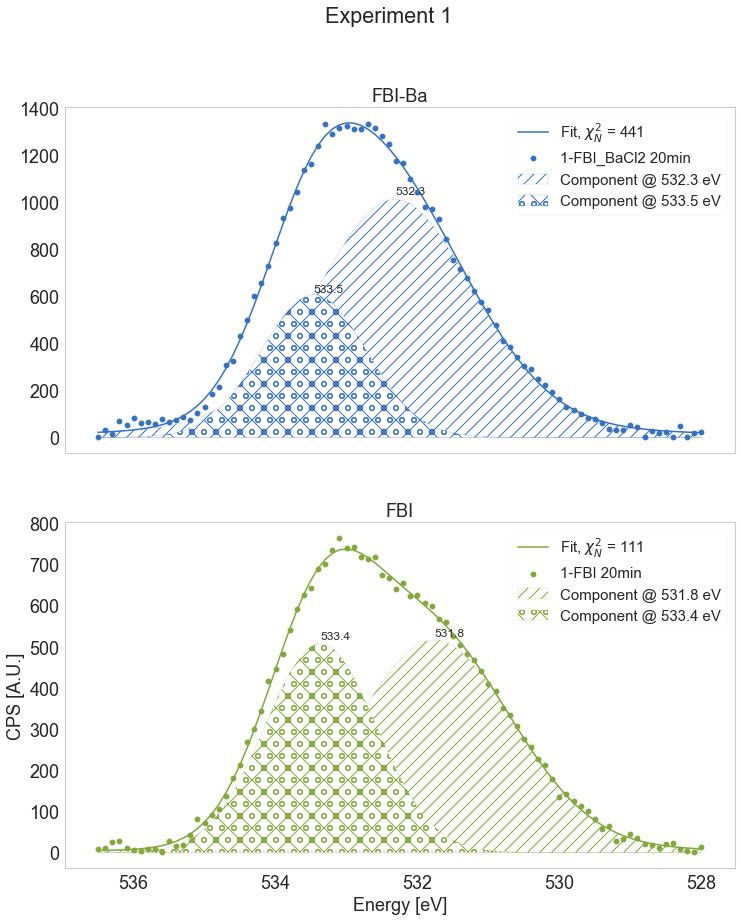

In [9]:
fig, (ax1, ax2) = plt.subplots(2, 1, sharex=True, figsize=(12, 14))

fitRes = fit_double_voigt(fbiBa_exps[0], region, sepPt=532, ax=ax1)
ax1.set(title='FBI-Ba')


fitRes = fit_double_voigt(fbi_exps[0], region, sepPt=532, ax=ax2)
# hatchplot_fit(fbi_exps[0], region, fitRes, ax=ax2, plot_comps=True, marker = 'x', ls='dashed')
ax2.set(title='FBI')

plt.suptitle('Experiment 1')
cosmetics_plot()

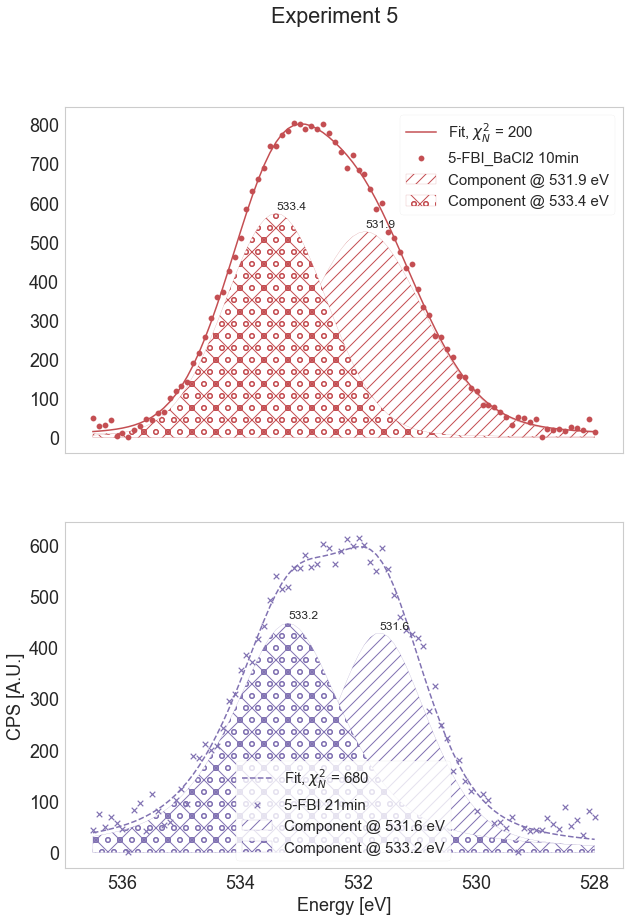

In [181]:
fig, (ax1, ax2) = plt.subplots(2, 1, sharex=True, figsize=(12, 14))

fitRes = fit_double_voigt(fbiBa_exps[1], region, sepPt=532, flag_plot=False)
hatchplot_fit(fbiBa_exps[1], region, fitRes, ax=ax1, plot_comps=True)
ax1.set(title='FBI-Ba')

fitRes = fit_double_voigt(fbi_exps[8], region, sepPt=532, flag_plot=False)
hatchplot_fit(fbi_exps[8], region, fitRes, ax=ax2, plot_comps=True, marker = 'x', ls='dashed')
ax2.set(title='FBI')

plt.suptitle('Experiment 5')
cosmetics_plot()

Modify user pars


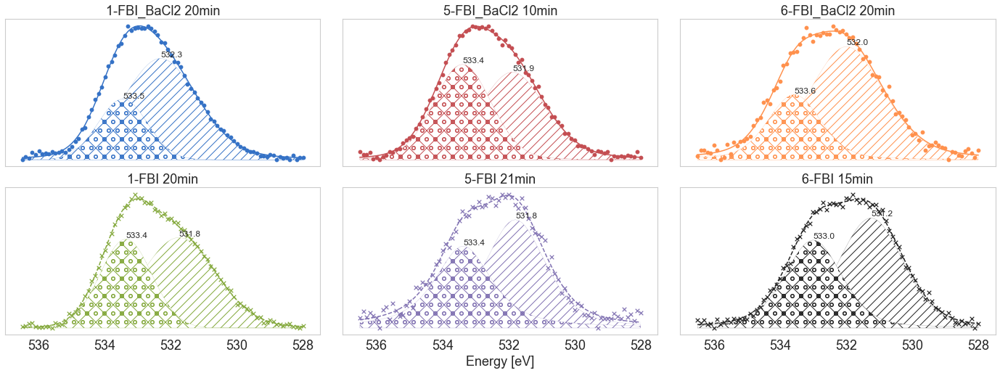

In [17]:
fig, (ax1, ax2) = plt.subplots(2, 3, sharex=True, figsize=(19, 7), )
region = 'O_1s'
for i,xp in enumerate(fbiBa_exps):
    Fn = XPFit(xp, region=region)

    Fn.double_voigt(sepPt=532)
    Fn.plot( ax = ax1[i])
    ax1[i].set(title=xp.name, yticks=[])
    Fn.set_areas()
    
for i, xp in enumerate(fbi_sel):    
    Fn = XPFit(xp, region=region)
    if i == 1: 
        Fn.preset_pars(key='v1_amplitude', val=1400)
        ax2[i].set_xlabel('Energy [eV]')

    Fn.double_voigt(sepPt=532)
    Fn.plot( ax = ax2[i], marker='x', ls = 'dashed')
    ax2[i].invert_xaxis()
    ax2[i].set(title=xp.name, yticks=[])
    Fn.set_areas()
plt.tight_layout(w_pad=0.5, h_pad=0.5, pad=0.1)
ax2[i].get_legend().remove()
ax2[i].set(xlabel='', ylabel='')
plt.gcf().savefig('/Users/pabloherrero/Dropbox/phd/papers/fbi_cu_sublimation/fits_o1s.png', dpi=200)

In [231]:
region = 'O_1s'
table_fit_area(fbi_sel, region=region)

comp	center	fwhm	amplitude	area	
v1	531.76	 2.66	 1546.67	 0.60
v2	533.37	 1.84	 996.47	 0.40
v1	531.79	 2.18	 1400.00	 0.57
v2	533.37	 2.05	 1093.72	 0.43
v1	531.25	 2.33	 3376.04	 0.58
v2	533.00	 2.05	 2467.41	 0.42


In [232]:
table_fit_area(fbiBa_exps, region='O_1s')

comp	center	fwhm	amplitude	area	
v1	532.32	 2.69	 3187.10	 0.73
v2	533.46	 1.75	 1127.93	 0.27
v1	531.89	 2.39	 1518.29	 0.53
v2	533.40	 2.04	 1295.04	 0.47
v1	531.99	 2.68	 2405.46	 0.71
v2	533.57	 1.89	 954.18	 0.29


## Fit N 1s 

Modify user pars


[Text(915.3764705882354, 0.5, ''), Text(0.5, 35.400000000000055, '')]

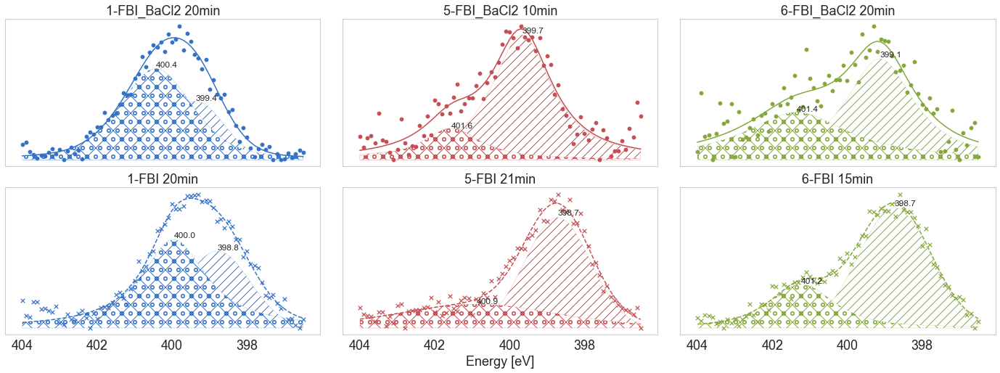

In [238]:
fig, (ax1, ax2) = plt.subplots(2, 3, sharex=True, figsize=(19, 7), )
region = 'N_1s'

for i,xp in enumerate(fbiBa_exps):
    Fn = XPFit(xp, region=region)
    if i == 2: Fn.preset_pars(key='v1_amplitude', val=300)

    Fn.double_voigt(sepPt=400)
    Fn.plot( ax = ax1[i])
    ax1[i].set(title=xp.name, yticks=[])
    
    Fn.set_areas()
    
for i, xp in enumerate(fbi_sel):    
    Fn = XPFit(xp, region=region)

    Fn.double_voigt(sepPt=400)
    Fn.plot( ax = ax2[i], marker='x', ls = 'dashed')

    ax2[i].invert_xaxis()
    ax2[i].set(title=xp.name, yticks=[])
    Fn.set_areas()
ax2[1].set_xlabel('Energy [eV]')
plt.tight_layout(w_pad=0.5, h_pad=0.5, pad=0.1)
ax2[i].get_legend().remove()
ax2[i].set(xlabel='', ylabel='')
# plt.gcf().savefig('/Users/pabloherrero/Dropbox/phd/papers/fbi_cu_sublimation/fits_n1s.png', dpi=200)

In [37]:
fbiBa_exps[1].fit[region].params['v1_amplitude']
# fbiBa_exps[2].fit[region].params['v1_fraction']

<Parameter 'v1_amplitude', value=314.5924922715557 +/- 42.5, bounds=[-inf:inf]>

## Fit C 1s

Modify user pars
Modify user pars
Modify user pars
Modify user pars
Modify user pars
Modify user pars
Modify user pars


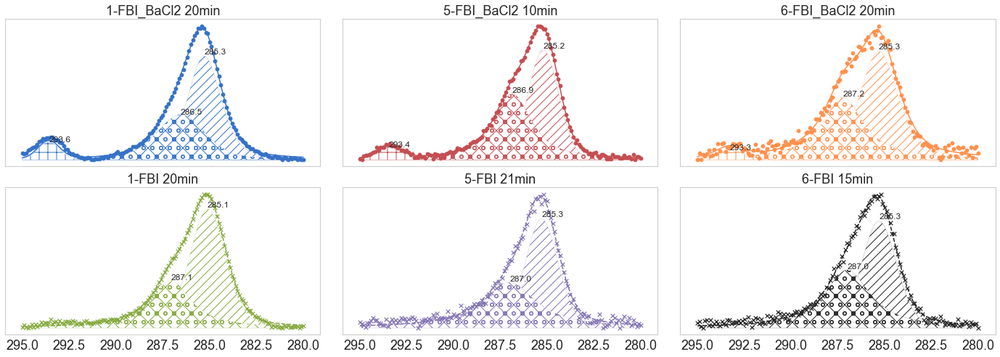

In [26]:
fig, (ax1, ax2) = plt.subplots(2, 3, sharex=True, figsize=(19, 7), )
region = 'C_1s'
pars = [100, 293.3, 1]
bounds = [(50, 500), (293, 294), (0.5, 2.)]

for i,xp in enumerate(fbiBa_exps):
    Fn = XPFit(xp, region=region)
    if i == 2: Fn.preset_pars(key='v1_amplitude', val=2200)
    if i == 0 : 
        Fn.preset_pars(key='v2_amplitude', val=3400)
#         Fn.preset_pars(key='v2_fraction', val=0.7)
        

    fitvv = Fn.double_voigt(sepPt=286.5)
    Fn.gauss_shoulder(fitvv, par_g=pars, bounds_g=bounds)
    Fn.plot( ax = ax1[i])
    ax1[i].set(title=xp.name, yticks=[])
    Fn.set_areas()
    

amp = [3000, 2000, 3300]
for i, xp in enumerate(fbi_sel):
    Fn = XPFit(xp, region=region)
    Fn.preset_pars(key='v1_amplitude', val=amp[i])
    
    Fn.double_voigt(sepPt=286.5)
    Fn.plot( ax = ax2[i], marker='x', ls = 'dashed')
    ax2[i].invert_xaxis()
    ax2[i].set(title=xp.name, yticks=[])
    Fn.set_areas()
plt.tight_layout(w_pad=0.5, h_pad=0.5, pad=0.1)
ax2[i].get_legend().remove()
ax2[i].set(xlabel='', ylabel='')
plt.gcf().savefig('/Users/pabloherrero/Dropbox/phd/papers/fbi_cu_sublimation/fits_c1s.png', dpi=200)

Modify user pars


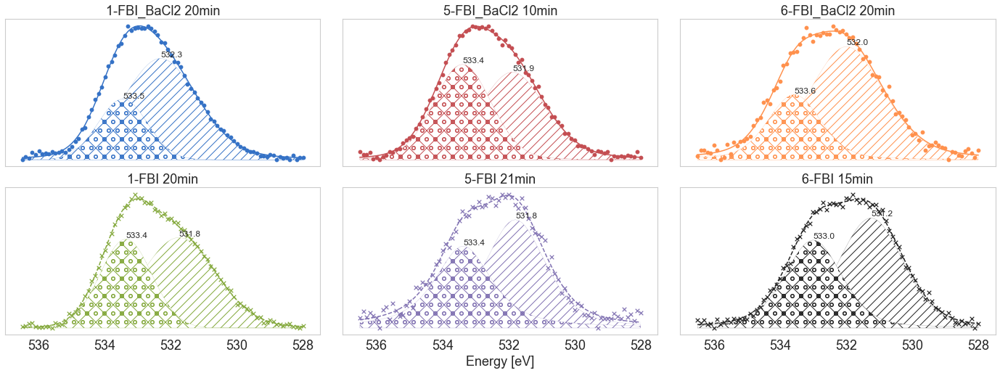

In [17]:
fig, (ax1, ax2) = plt.subplots(2, 3, sharex=True, figsize=(19, 7), )
region = 'O_1s'

for i,xp in enumerate(fbiBa_exps):
    Fn = XPFit(xp, region=region)

    Fn.double_voigt(sepPt=532)
    Fn.plot( ax = ax1[i])
    ax1[i].set(title=xp.name, yticks=[])
    Fn.set_areas()
    
for i, j in enumerate([0, 8, 9]):
    Fn = XPFit(fbi_exps[j], region=region)
    if i == 1: 
        Fn.preset_pars(key='v1_amplitude', val=1400)
        ax2[i].set_xlabel('Energy [eV]')

    Fn.double_voigt(sepPt=532)
    Fn.plot( ax = ax2[i], marker='x', ls = 'dashed')
    ax2[i].invert_xaxis()
    ax2[i].set(title=fbi_exps[j].name, yticks=[])
    Fn.set_areas()
plt.tight_layout(w_pad=0.5, h_pad=0.5, pad=0.1)
ax2[i].get_legend().remove()
ax2[i].set(xlabel='', ylabel='')
plt.gcf().savefig('/Users/pabloherrero/Dropbox/phd/papers/fbi_cu_sublimation/fits_o1s.png', dpi=200)

In [197]:
region = 'C_1s'
table_fit_area(fbi_sel, region='C_1s')

comp	center	fwhm	amplitude	area	
v1	285.11	 2.27	 3000.00	 0.64
v2	287.07	 2.55	 1795.84	 0.36
v1	285.29	 2.05	 2000.00	 0.55
v2	287.01	 3.37	 1850.13	 0.45
v1	285.30	 2.20	 3300.00	 0.53
v2	287.00	 2.93	 3257.07	 0.47


In [228]:
region = 'C_1s'
table_fit_area(fbiBa_exps, region='C_1s')

comp	center	fwhm	amplitude	area	
v1	285.40	 2.28	 6483.81	 0.71
v2	287.26	 2.35	 2267.05	 0.23
g1	293.59	 1.34	 500.00	 0.06
v1	285.20	 1.92	 1774.18	 0.49
v2	286.86	 2.47	 1888.27	 0.47
g1	293.45	 1.53	 162.49	 0.04
v1	285.31	 2.42	 2200.00	 0.57
v2	287.23	 2.66	 1641.41	 0.40
g1	293.26	 1.70	 113.43	 0.03


## Table results

In [161]:
def table_fit_area(exps: list, region: str):
    """Print a table with fit results and relative areas dict"""
    par_table = ['center', 'fwhm', 'amplitude', 'area']
    head = 'comp\t'

    for par in par_table: 
        head += '%s\t'%par

    print(head)

    for xp in exps:
        fit = xp.fit[region]
        for i, comp in enumerate(fit.components):
            pref = comp.prefix
            line = pref[:-1] + '\t'

            for par in par_table[:-1]:
                line += '%.2f\t '%fit.values[pref + par]        
            line += '%.2f'%xp.area[region+'_'+pref]

            print(line)

In [505]:
table_fit_area(fbiBa_exps, region)

comp	center	fwhm	area	
v1	285.40	 2.28	 0.71
v2	287.27	 2.35	 0.23
g1	293.59	 1.34	 0.06
v1	285.18	 1.88	 0.50
v2	286.78	 2.57	 0.46
g1	293.44	 1.56	 0.05
v1	285.31	 2.42	 0.57
v2	287.23	 2.66	 0.40
g1	293.26	 1.70	 0.03


### Latex style + custom fbi/fbi-ba arrangement

In [96]:
def table_fbifbiba(region):
    """Print a table with fit results and relative areas dict"""
    par_table = ['center', 'fwhm', 'area']
    head = 'exp & comp & '
    head2 = ''
    for par in par_table: 
        head += '%s & '%par
        head2 += '& FBI & FBI-Ba & '
    print(region, ' fits')
    print(head)
    print(head2)

    for xpba, xp in zip(fbiBa_exps, fbi_sel):
        fit = xp.fit[region]
        fitba = xpba.fit[region]
        line = '\hline\n '
        for i, comp in enumerate(fitba.components):
            pref = comp.prefix
            line += '{} & ' + pref[:-1] + ' & '
            for par in par_table[:-1]:
                if i < 2:
                    line += '%.2f & '%fit.values[pref + par]
                line += '%.2f & '%fitba.values[pref + par]
            if i < 2:
                line += '%.2f & '%xp.area[region+'_'+pref]
            line += '%.2f \\\ \n'%xpba.area[region+'_'+pref]
        print(line)

In [184]:
table_fbifbiba('C_1s')

C_1s  fits
exp & comp & center & fwhm & area & 
& FBI & FBI-Ba & & FBI & FBI-Ba & & FBI & FBI-Ba & 
\hline
 {} & v1 & 285.11 & 285.40 & 2.27 & 2.28 & 0.64 & 0.71 \\ 
{} & v2 & 287.07 & 287.27 & 2.55 & 2.35 & 0.36 & 0.23 \\ 
{} & g1 & 293.59 & 1.34 & 0.06 \\ 

\hline
 {} & v1 & 285.29 & 285.18 & 2.05 & 1.88 & 0.55 & 0.50 \\ 
{} & v2 & 287.01 & 286.78 & 3.37 & 2.57 & 0.45 & 0.46 \\ 
{} & g1 & 293.44 & 1.56 & 0.05 \\ 

\hline
 {} & v1 & 285.30 & 285.31 & 2.20 & 2.42 & 0.53 & 0.57 \\ 
{} & v2 & 287.00 & 287.23 & 2.93 & 2.66 & 0.47 & 0.40 \\ 
{} & g1 & 293.26 & 1.70 & 0.03 \\ 



In [98]:
table_fbifbiba('O_1s')

O_1s  fits
exp & comp & center & fwhm & area & 
& FBI & FBI-Ba & & FBI & FBI-Ba & & FBI & FBI-Ba & 
\hline
 {} & v1 & 531.76 & 532.32 & 2.66 & 2.69 & 0.60 & 0.73 \\ 
{} & v2 & 533.37 & 533.46 & 1.84 & 1.75 & 0.40 & 0.27 \\ 

\hline
 {} & v1 & 531.79 & 531.89 & 2.18 & 2.39 & 0.57 & 0.53 \\ 
{} & v2 & 533.37 & 533.40 & 2.05 & 2.04 & 0.43 & 0.47 \\ 

\hline
 {} & v1 & 531.25 & 531.99 & 2.33 & 2.68 & 0.58 & 0.71 \\ 
{} & v2 & 533.00 & 533.57 & 2.05 & 1.89 & 0.42 & 0.29 \\ 



In [99]:
table_fbifbiba('N_1s')

N_1s  fits
exp & comp & center & fwhm & area & 
& FBI & FBI-Ba & & FBI & FBI-Ba & & FBI & FBI-Ba & 
\hline
 {} & v1 & 398.79 & 399.37 & 2.05 & 1.77 & 0.41 & 0.31 \\ 
{} & v2 & 399.95 & 400.44 & 2.09 & 2.28 & 0.59 & 0.69 \\ 

\hline
 {} & v1 & 398.72 & 399.67 & 2.05 & 1.93 & 0.67 & 0.81 \\ 
{} & v2 & 400.88 & 401.56 & 5.06 & 1.83 & 0.33 & 0.19 \\ 

\hline
 {} & v1 & 398.74 & 399.13 & 2.26 & 2.15 & 0.72 & 0.60 \\ 
{} & v2 & 401.23 & 401.35 & 2.06 & 3.33 & 0.28 & 0.40 \\ 



# Old style

## Fit O

In [6]:
cu_exps[1].color = 'b'
cu_exps[2].color = 'magenta'

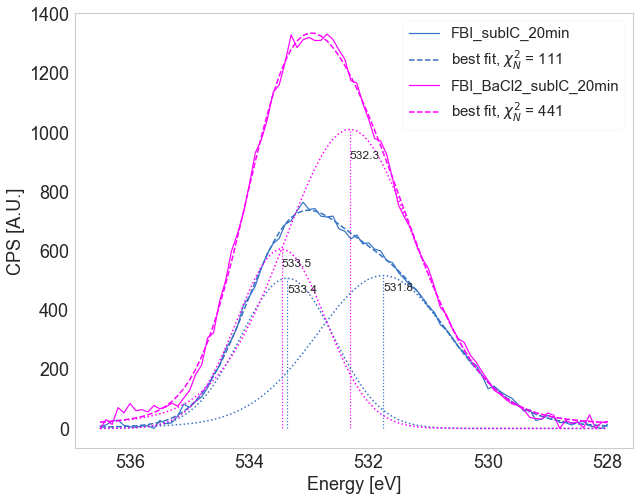

In [7]:
region = 'O_1s'
plt.figure(figsize=(10, 8))
fitcu = fit_double_voigt(cu_exps[1], region, sepPt=532, plot_comps=True)
fitcu = fit_double_voigt(cu_exps[2], region, sepPt=532, plot_comps=True)
cosmetics_plot()

/Users/pabloherrero/anaconda3/envs/IC-3.7-2018-11-14/lib/python3.7/site-packages/numpy/core/fromnumeric.py:56: FutureWarning: 'argmin' is deprecated, use 'idxmin' instead. The behavior of 'argmin'
will be corrected to return the positional minimum in the future.
Use 'series.values.argmin' to get the position of the minimum now.
  return getattr(obj, method)(*args, **kwds)


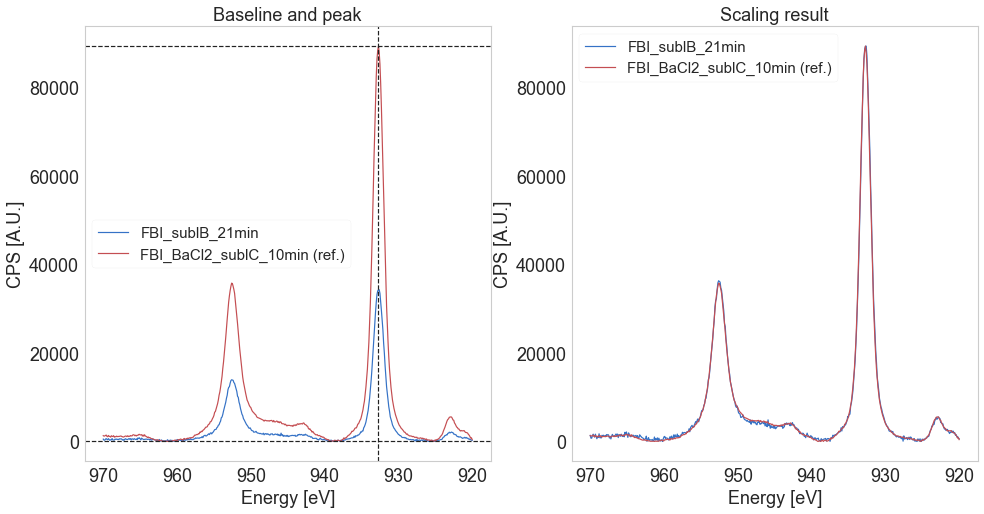

In [8]:
cu_exps[14].color = 'lime'
cu_exps[15].color = 'm'
scaleFact = scale_and_plot_spectra(cu_exps[14], cu_exps[15], region='Cu_2p')
scale_dfx(xp = cu_exps[14], scale_factor = scaleFact, inplace=True)

cu_exps[16].color = 'b'
cu_exps[17].color= 'gold'

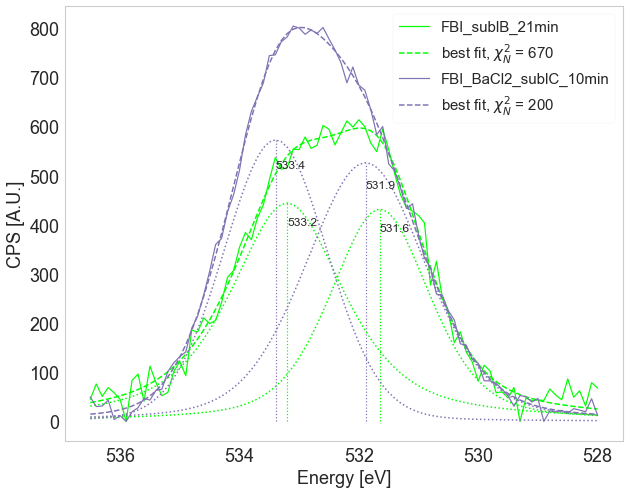

In [9]:
region = 'O_1s'
plt.figure(figsize=(10, 8))
fitcu = fit_double_voigt(cu_exps[14], region, sepPt=532, plot_comps=True)
fitcu = fit_double_voigt(cu_exps[15], region, sepPt=532, plot_comps=True)
cosmetics_plot()

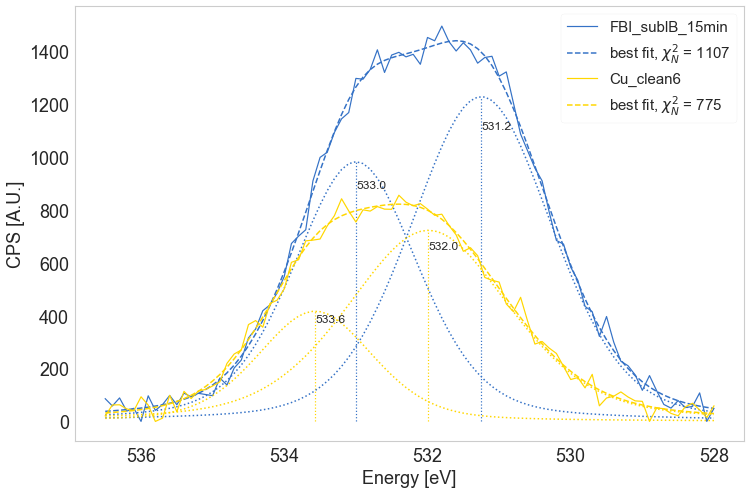

In [10]:
region = 'O_1s'
plt.figure(figsize=(12, 8))
fitcu = fit_double_voigt(cu_exps[16], region, sepPt=532, plot_comps=True)
fitcu = fit_double_voigt(cu_exps[17], region, sepPt=532, plot_comps=True)
cosmetics_plot()

In [6]:
shoulder = comps['v1_']
main = comps['v2_']
area_sho = np.trapz(shoulder, x=x[::-1])
area_main = np.trapz(main, x=x[::-1])
area_sho/(area_main*frac)

NameError: name 'frac' is not defined

## Fit N

/Users/pabloherrero/anaconda3/envs/IC-3.7-2018-11-14/lib/python3.7/site-packages/lmfit/models.py:34: FutureWarning: 'argmin' is deprecated, use 'idxmin' instead. The behavior of 'argmin'
will be corrected to return the positional minimum in the future.
Use 'series.values.argmin' to get the position of the minimum now.
  return np.abs(arr-val).argmin()


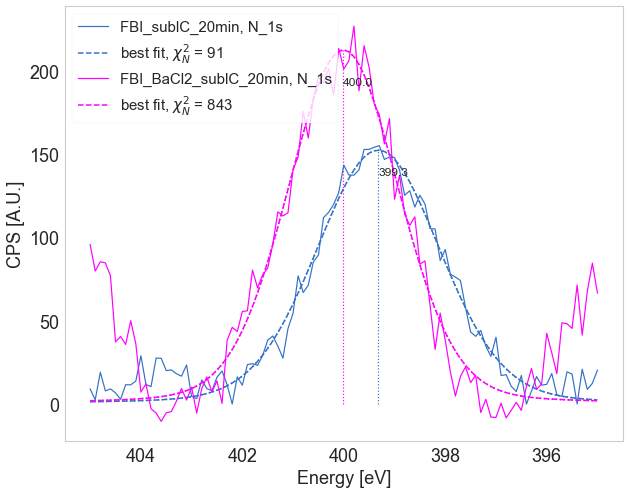

In [41]:
region = 'N_1s'
plt.figure(figsize=(10, 8))
fitcu = fit_voigt(cu_exps[1], region)#, plot_comps=True)
fitcu = fit_voigt(cu_exps[2], region)#, plot_comps=True)
cosmetics_plot()

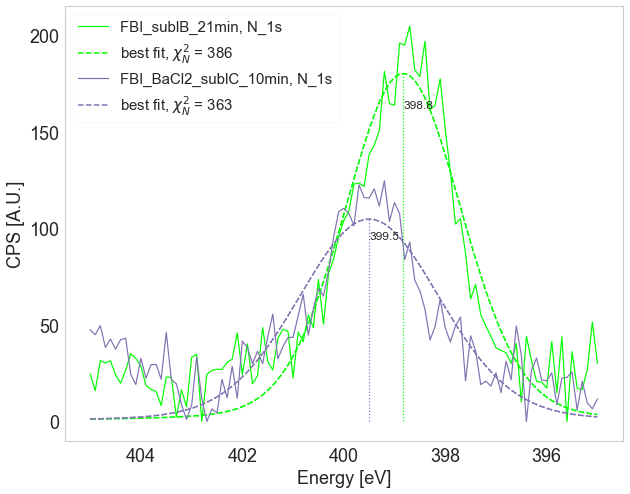

In [42]:
region = 'N_1s'
plt.figure(figsize=(10, 8))
fitcu = fit_voigt(cu_exps[14], region)#, plot_comps=True)
fitcu = fit_voigt(cu_exps[15], region)#, plot_comps=True)
cosmetics_plot()

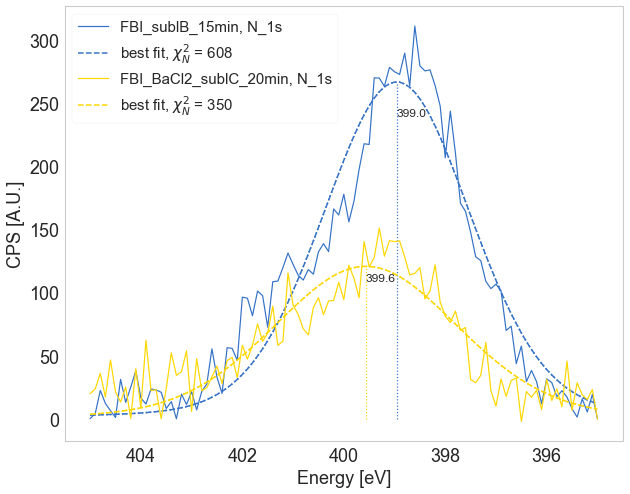

In [43]:
region = 'N_1s'
plt.figure(figsize=(10, 8))
fitcu = fit_voigt(cu_exps[16], region)#, plot_comps=True)
fitcu = fit_voigt(cu_exps[17], region)#, plot_comps=True)
cosmetics_plot()

## Fit Ba 3d 

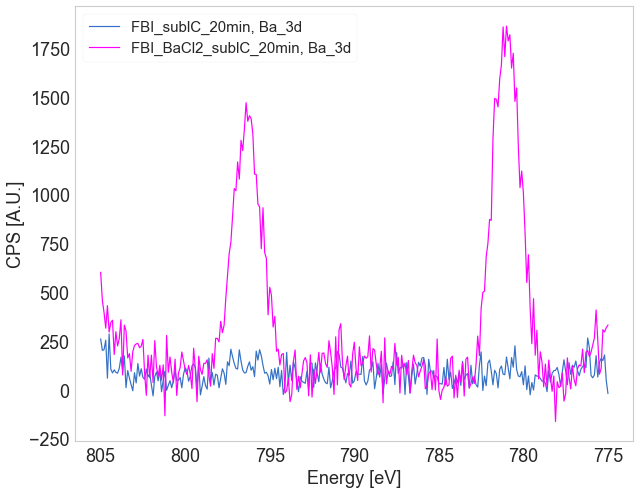

In [52]:
region = 'Ba_3d'
plt.figure(figsize=(10, 8))
plot_region(cu_exps[1], region)
plot_region(cu_exps[2], region)
cosmetics_plot()

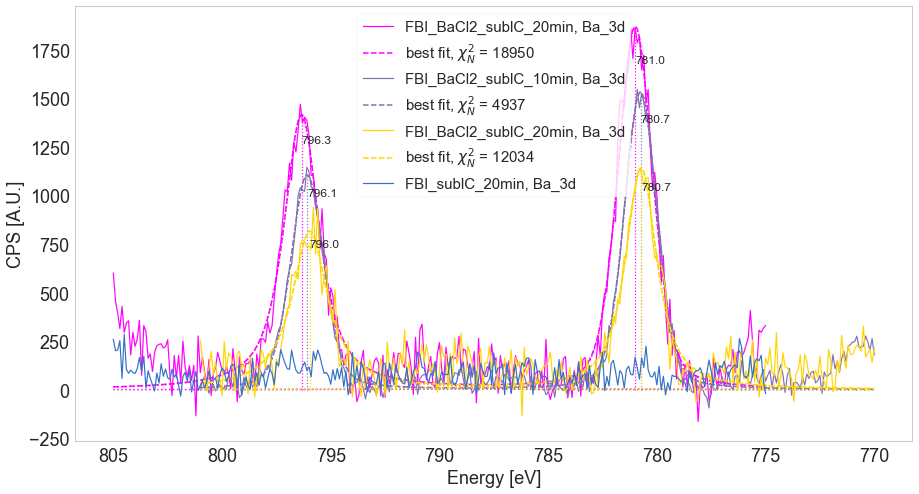

In [53]:
plt.figure(figsize=(15, 8))
fitcu = fit_double_voigt(cu_exps[2], region, sepPt=790, plot_comps=True)
fitcu = fit_double_voigt(cu_exps[15], region, sepPt=790, plot_comps=True)
fitcu = fit_double_voigt(cu_exps[17], region, sepPt=790, plot_comps=True)
plot_region(cu_exps[1], region)

cosmetics_plot()

In [111]:
sigma1 = fitcu.params['v_sigma'].value
dsigma1 = fitcu.params['v_sigma'].stderr
sigma1, dsigma1
fitcu.params['v_center']
fitcu.params['v_sigma'].set(max=1.1*sigma1)

## Cl 2p, 2s

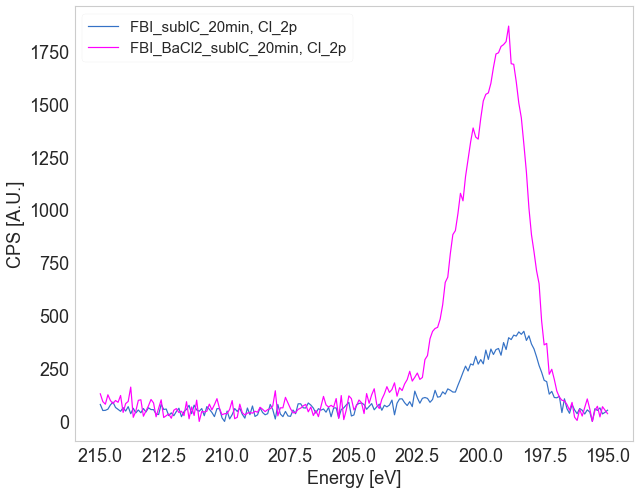

In [56]:
region = 'Cl_2p'
plt.figure(figsize=(10, 8))
plot_region(cu_exps[1], region)
plot_region(cu_exps[2], region)
cosmetics_plot()

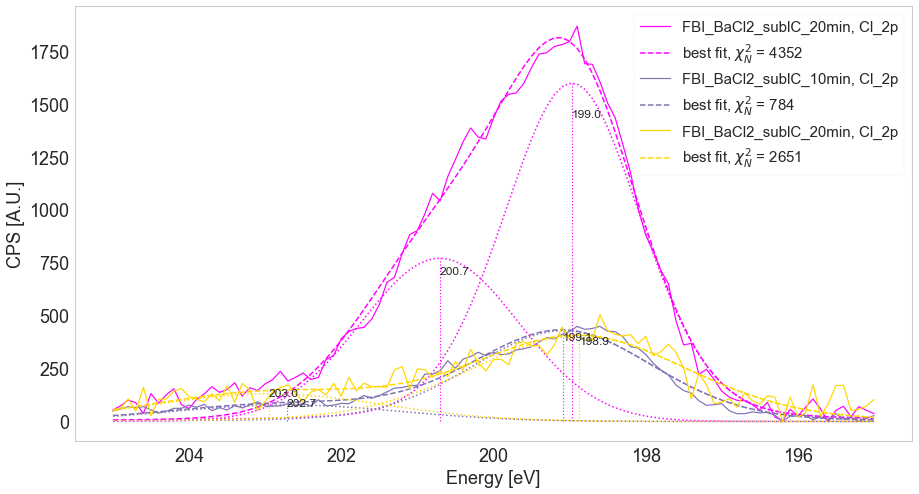

In [63]:
region = 'Cl_2p'
plt.figure(figsize=(15, 8))
par_g = [1e3, 201, 1.0]
bounds_g = [(200, 2e3), (199, 203), (0.3, 1.5)]

for i in [2, 15, 17]:
    fitcu = fit_voigt(cu_exps[i], region, flag_plot=False)
    xp_crop = crop_spectrum(cu_exps[i],  region, eup = 205)
    add_gauss_shoulder(xp_crop, region, par_g, bounds_g, fitv=fitcu )

# fitcu = fit_voigt(cu_exps[15], region, flag_plot=False)
# add_gauss_shoulder(cu_exps[15], region, par_g, bounds_g, fitv=fitcu )

# fitcu = fit_voigt(cu_exps[17], region, flag_plot=False)
# add_gauss_shoulder(cu_exps[17], region, par_g, bounds_g, fitv=fitcu )


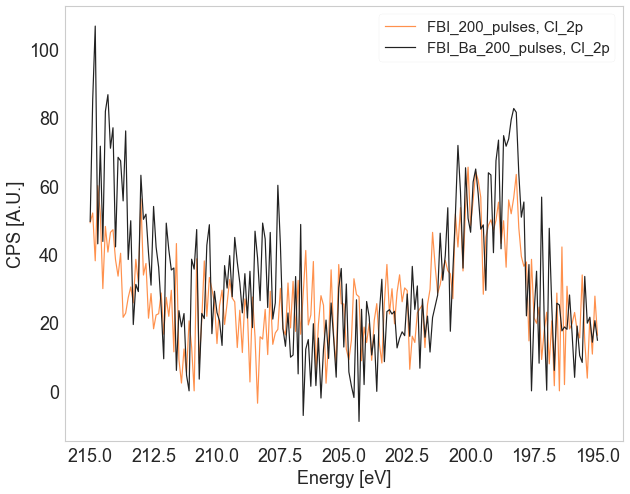

In [51]:
plt.figure(figsize=(10, 8))
plot_region(cu_exps[3], region)
plot_region(cu_exps[4], region)
# fitcu = fit_double_voigt(cu_exps[4], region, sepPt=199, plot_comps=True)
cosmetics_plot()

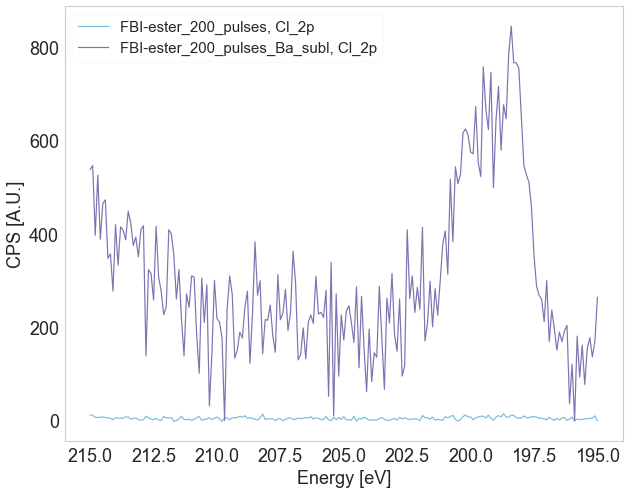

In [53]:
plt.figure(figsize=(10, 8))
plot_region(cu_exps[6], region)
plot_region(cu_exps[7], region)
# fitcu = fit_double_voigt(cu_exps[7], region, sepPt=199, plot_comps=True)
cosmetics_plot()

In [138]:
asf = {'Cl_2p' : 0.891}
asf['Cl_2s'] = 1.7 * 0.816 / 0.891
(area_2s/asf['Cl_2s']) * asf['Cl_2p'] / (area_main + area_sho)

1.7427445851854548

# Sample 11-13 from February '21

##### Pop samples 13-8 min BaCl2 and 13-12 min BaCl2 first

In [7]:
path = '/Users/pabloherrero/sabat/xps_spectra/FBI_Cu/FBI_subl/2021_02_*/**/*.uxy'

files = glob.glob(path, recursive=True)
files.sort()
files_new = []
for f in files:
    if '/proc' in f:
        files_new.append(f)
files = files_new
files.pop(7)
files.pop(8)
# files = files[:9]
files

['/Users/pabloherrero/sabat/xps_spectra/FBI_Cu/FBI_subl/2021_02_01_Cu/proc/20210201_11-Cu_FBI_subl_20min.uxy',
 '/Users/pabloherrero/sabat/xps_spectra/FBI_Cu/FBI_subl/2021_02_01_Cu/proc/20210201_11-Cu_FBI_subl_20min_BaCl2_2min.uxy',
 '/Users/pabloherrero/sabat/xps_spectra/FBI_Cu/FBI_subl/2021_02_01_Cu/proc/20210201_11-Cu_clean.uxy',
 '/Users/pabloherrero/sabat/xps_spectra/FBI_Cu/FBI_subl/2021_02_02_Cu/proc/20210202_12-Cu_FBI_subl_20min.uxy',
 '/Users/pabloherrero/sabat/xps_spectra/FBI_Cu/FBI_subl/2021_02_02_Cu/proc/20210202_12-Cu_FBI_subl_20min_BaCl2_4min.uxy',
 '/Users/pabloherrero/sabat/xps_spectra/FBI_Cu/FBI_subl/2021_02_02_Cu/proc/20210202_12-Cu_clean.uxy',
 '/Users/pabloherrero/sabat/xps_spectra/FBI_Cu/FBI_subl/2021_02_03_Cu/proc/20210203_13-Cu_FBI_subl_60min.uxy',
 '/Users/pabloherrero/sabat/xps_spectra/FBI_Cu/FBI_subl/2021_02_03_Cu/proc/20210203_13-Cu_FBI_subl_60min_BaCl2_08min.uxy',
 '/Users/pabloherrero/sabat/xps_spectra/FBI_Cu/FBI_subl/2021_02_03_Cu/proc/20210203_13-Cu_clean.

In [8]:
xpfbi = []
xpba = []
colors = ['b', 'g', 'r', 'y']
for i,f in enumerate(files):
    if 'Cu_FBI' in f:
        xpfbi.append(read_processed_xp(f))
    if 'BaCl2' in f:
        xpba.append(read_processed_xp(f, ls='--'))
        xpfbi.pop(-1)
        xpfbi[-1].color = 'g'
        xpba[-1].color = 'b'
        

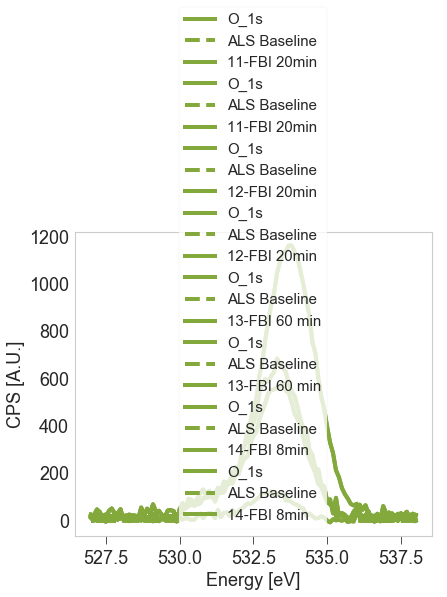

In [9]:
for xp in xpfbi:
    fix_tail_bg(xp, 'O_1s', edw=536, inplace=True)
    fix_tail_bg(xp, 'O_1s', eup=530, inplace=True)
    
#     plot_region(xp, 'O_1s')

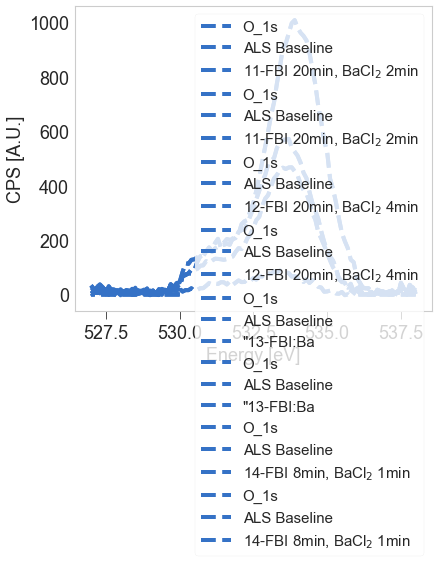

In [10]:
for xp in xpba:
    fix_tail_bg(xp, 'O_1s', edw=536, inplace=True)
    fix_tail_bg(xp, 'O_1s', eup=530, inplace=True)
    
#     plot_region(xp, 'O_1s')

## O 1s

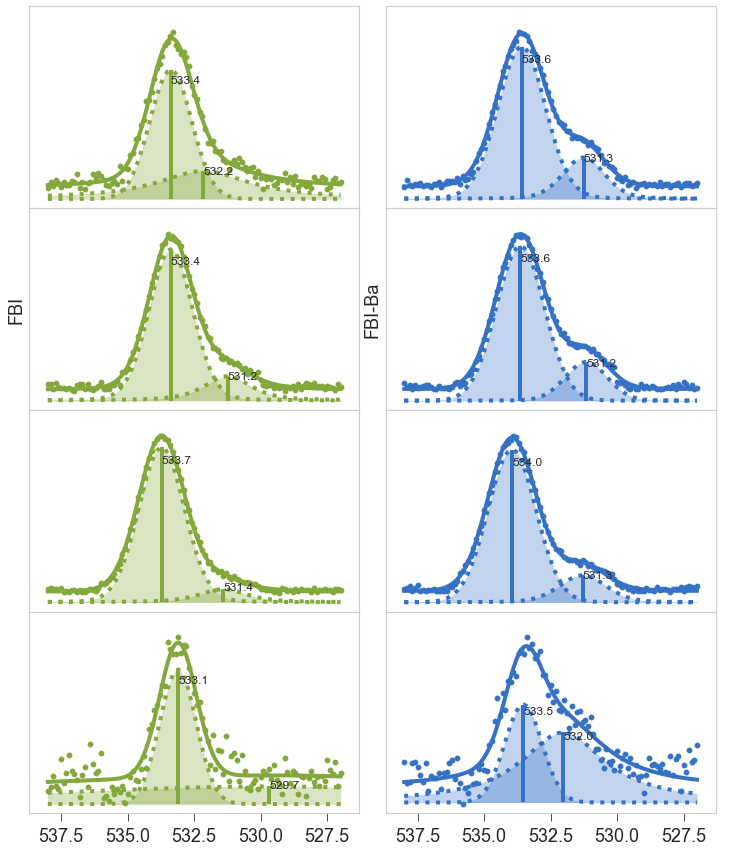

In [11]:
fig, ax = plt.subplots(4, 2, sharex=True, figsize=(10, 12 ), )
(ax1, ax2) = ax.T
region = 'O_1s'

for i,xp in enumerate(xpfbi):
    Fn = XPFit(xp, region=region)
    # Fn.preset_pars(key='v1_amplitude', val=300)

    Fn.double_voigt(sepPt=532)
    plot_fit_result(xp, region, fitRes=xp.fit[region], ax=ax1[i], flag_fill=True)
    ax1[i].set(yticks=[], ylim=tuple([yl * 1.1 for yl in ax1[i].get_ylim()]))
    Fn.set_areas()
ax1[1].set(ylabel='FBI')

for i,xp in enumerate(xpba):
    Fn = XPFit(xp, region=region)

    Fn.double_voigt(sepPt=532)
    plot_fit_result(xp, region, fitRes=xp.fit[region], ax=ax2[i], flag_fill=True)
    ax2[i].set( yticks=[], ylim=tuple([yl * 1.1 for yl in ax2[i].get_ylim()]))
    Fn.set_areas()
    ax2[i].set_xlabel('Energy [eV]')
ax2[i].invert_xaxis()
ax2[1].set(ylabel='FBI-Ba')
plt.tight_layout(w_pad=0.5, h_pad=0.5, pad=0.1)
ax2[i].set(xlabel='', ylabel='')
plt.subplots_adjust(hspace=.0)
plt.subplots_adjust(wspace=.08)
# plt.gcf().savefig('/Users/pabloherrero/Dropbox/phd/papers/fbi_cu_sublim_v2/fits_o1s.png', dpi=200)

In [12]:
for xp, xpb in zip(xpfbi, xpba):
    crop_spectrum(xpb, 'Ba_3d', eup=799.5, inplace=True)
    xp.name = xp.name.replace('Cu_', '').replace('_subl_', ' ')
    xpb.name = xpb.name.replace('Cu_', '').replace('_subl_', ' ').replace('_BaCl2_', ', BaCl$_2$ ')  

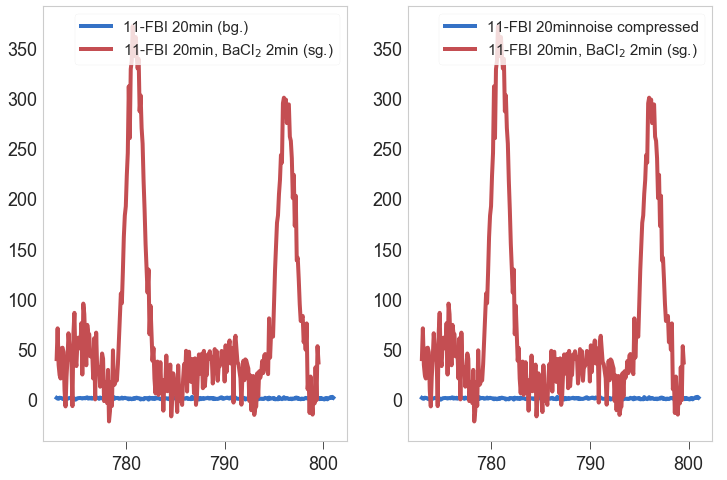

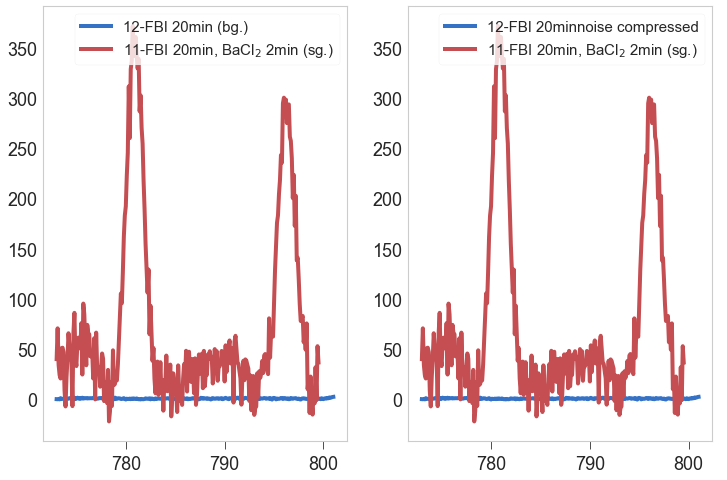

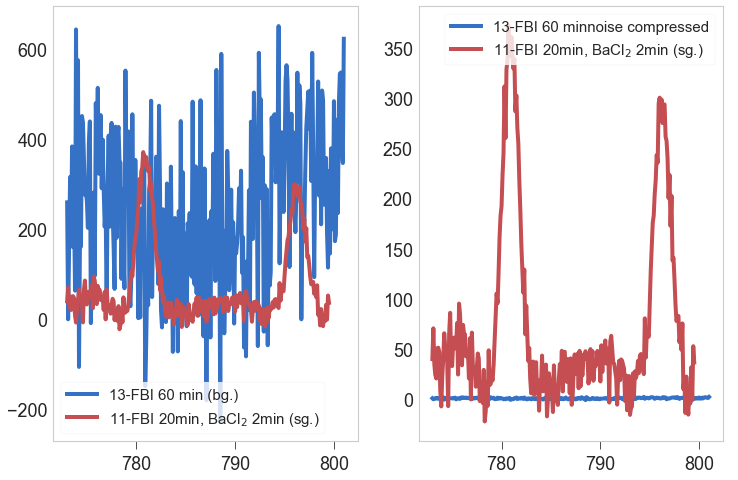

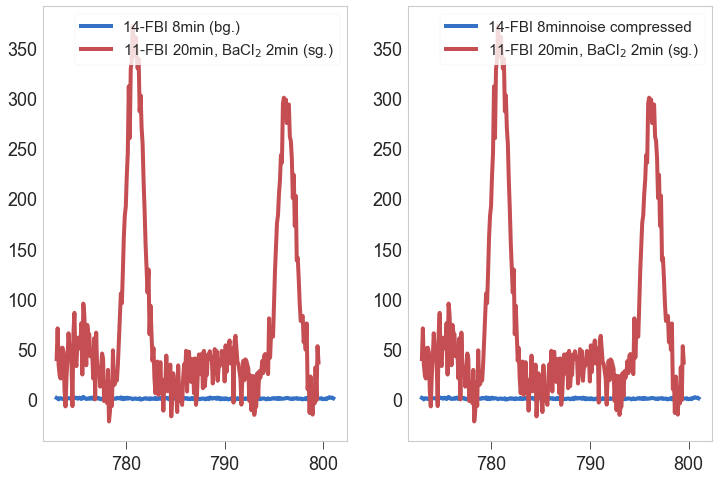

In [13]:
for xp in xpfbi:
    compress_noisy_region(xp, xpba[0], 'Ba_3d', inplace=True);


Modify user pars
Modify user pars
Modify user pars
Modify user pars


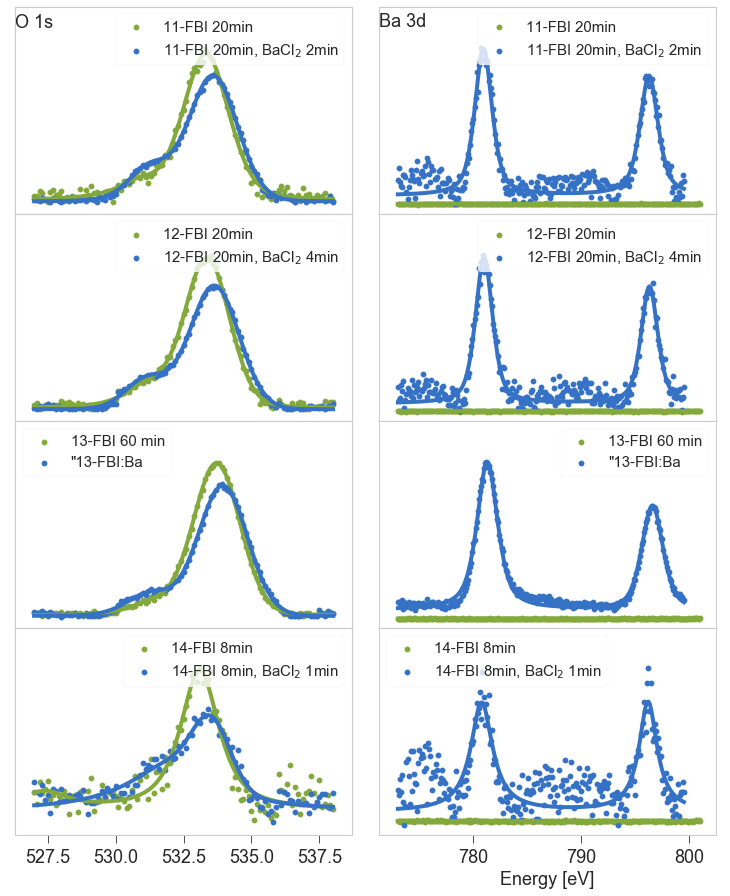

In [14]:
fig, ax = plt.subplots(4, 2, sharex=False, figsize=(10, 12 ), )
regs = ['O_1s', 'Ba_3d']
seps = [532, 790]
for j, r in enumerate(regs):
    for i,xp in enumerate(xpfbi):
        Fn = XPFit(xp, region=r)
        if j == 0: Fn.preset_pars(key='v1_sigma', val=1)
        Fn.double_voigt(sepPt=seps[j])
        plot_fit_result(xp, r, fitRes=xp.fit[r], ax=ax[i][j], flag_fill=False, plot_comps=False)
#         ax[i][j].set(yticks=[], ylim=tuple([yl * 1.2 for yl in ax[i][j].get_ylim()]))
        ax[i][j].legend()
        ax[i][j].invert_xaxis()
        Fn.set_areas()
        

for j, r in enumerate(regs):
    for i,xp in enumerate(xpba):
        Fn = XPFit(xp, region=r)
        Fn.double_voigt(sepPt=seps[j])
        plot_fit_result(xp, r, fitRes=xp.fit[r], ax=ax[i][j], flag_fill=False, plot_comps=False)
        ax[i][j].set( yticks=[], ylim=tuple([yl * 1.2 for yl in ax[i][j].get_ylim()]))
        ax[i][j].legend()
        ax[i][j].invert_xaxis()
        Fn.set_areas()
    ax[0][j].text(s=r.replace('_', ' '), x=(ax[0][j].get_xlim()[0]), y=(ax[0][j].get_ylim()[1]*0.9))
plt.tight_layout(w_pad=0.5, h_pad=0.5, pad=0.1)
ax[i][j].set(xlabel='Energy [eV]', ylabel='')
plt.subplots_adjust(hspace=.0)
plt.subplots_adjust(wspace=.08)
# plt.gcf().savefig('/Users/pabloherrero/Dropbox/phd/papers/fbi_cu_sublim_v2/fits_o1s.png', dpi=200)

In [15]:
area_small = []
ea_small = []
area_big = []
ea_big = []
for xp in xpba:
    print(xp.area['O_1s_v2_'], xp.area['O_1s_v1_'] )
    area_small.append(xp.area['O_1s_v1_'])
    ea_small.append(np.sqrt(xp.area['O_1s'])/xp.area['O_1s'] * xp.area['O_1s_v1_'] ) 
    area_big.append(xp.area['O_1s_v2_'])
    ea_big.append(np.sqrt(xp.area['O_1s'])/xp.area['O_1s'] * xp.area['O_1s_v2_'] ) 

area_small[3], area_big[3] = area_big[3], area_small[3]
ea_small[3], ea_big[3] = ea_big[3], ea_small[3]
## For whatever reason in the last xp big and small areas
## were switched, unswitch them

area_small.sort()
area_big.sort()
ea_small.sort()
ea_big.sort()
area_big

0.7986315720084903 0.20136842799150967
0.8173888501453278 0.1826111498546721
0.8459073731334237 0.1540926268665763
0.3423814457502868 0.6576185542497132


[0.6576185542497132,
 0.7986315720084903,
 0.8173888501453278,
 0.8459073731334237]

Text(0, 0.5, 'O 1s v1 relative area')

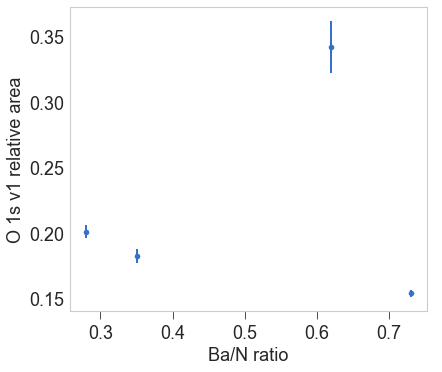

In [278]:
ba2n = [0.28, 0.35, 0.73, 0.62]
plt.errorbar(ba2n, area_small, yerr=ea_small,fmt='o')
plt.xlabel('Ba/N ratio')
plt.ylabel('O 1s v1 relative area')

Text(0, 0.5, 'O 1s v2 relative area')

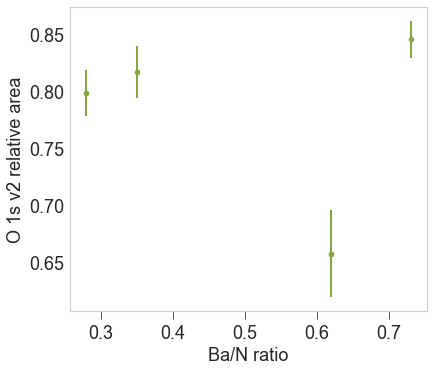

In [279]:
ba2n = [0.28, 0.35, 0.73, 0.62]
plt.errorbar(ba2n, area_big, yerr=ea_big,fmt='go')
plt.xlabel('Ba/N ratio')
plt.ylabel('O 1s v2 relative area')

In [129]:
plt.rcParams['lines.linewidth'] = 1.5

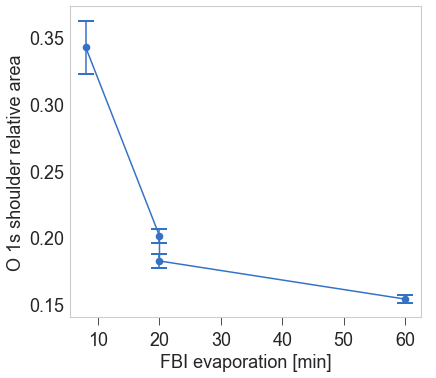

In [130]:
ba2n = [60, 20, 20, 8]
plt.errorbar(ba2n, area_small, yerr=ea_small,
             fmt='-o', capsize=8, markeredgewidth=2)
plt.xlabel('FBI evaporation [min]')
plt.ylabel('O 1s shoulder relative area')
plt.tight_layout()
plt.savefig('/Users/pabloherrero/Dropbox/phd/drafts/fbi_cu_sublimation/v3/o_shoulder_vs_coverage.png', dpi=100)

Text(0, 0.5, 'O 1s v1 relative area')

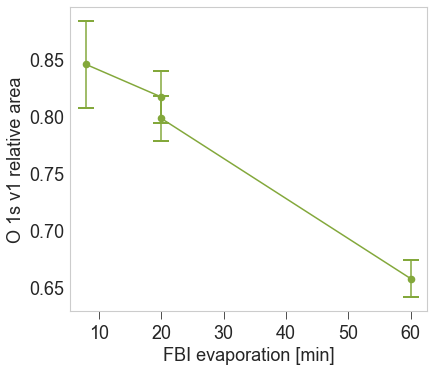

In [50]:
ba2n = [60, 20, 20, 8]
plt.errorbar(ba2n, area_big, yerr=ea_big,
             fmt='-og', capsize=8, markeredgewidth=2)
plt.xlabel('FBI evaporation [min]')
plt.ylabel('O 1s v1 relative area')

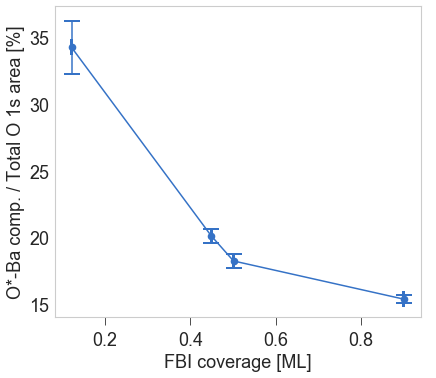

In [138]:
ba2n = [60, 20, 20, 8]
layers = [8.99023390e-01, 5.01105316e-01, 4.48988260e-01, 1.21961411e-01,]   # From xps_stoichiom_FBI_BaCl2_subl_Cu_2021.ipynb (3.0.2)
elayers = [2.25672086e-03, 1.10652374e-03, 1.02400705e-03, 2.89014747e-04]
plt.errorbar(layers, np.array(area_small)*100, yerr=np.array(ea_small)*100, xerr=elayers,
             fmt='-o', capsize=8, markeredgewidth=2)
plt.xlabel('FBI coverage [ML]')
plt.ylabel('O*-Ba comp. / Total O 1s area [%]')
plt.tight_layout()
plt.savefig('/Users/pabloherrero/Dropbox/phd/drafts/fbi_cu_sublimation/v3/o_shoulder_vs_coverage.png', dpi=100)

In [85]:
125 / 3.5 * 0.5

17.857142857142858

### Normalized

In [16]:
xnfbi = []
xnba = []
for xp, xpb in zip(xpfbi, xpba):
    xnfbi.append(normalise_dfx(xp))
    xnba.append(normalise_dfx(xpb))

Modify user pars
Modify user pars
Modify user pars
Modify user pars
Modify user pars
Modify user pars
Modify user pars
Modify user pars


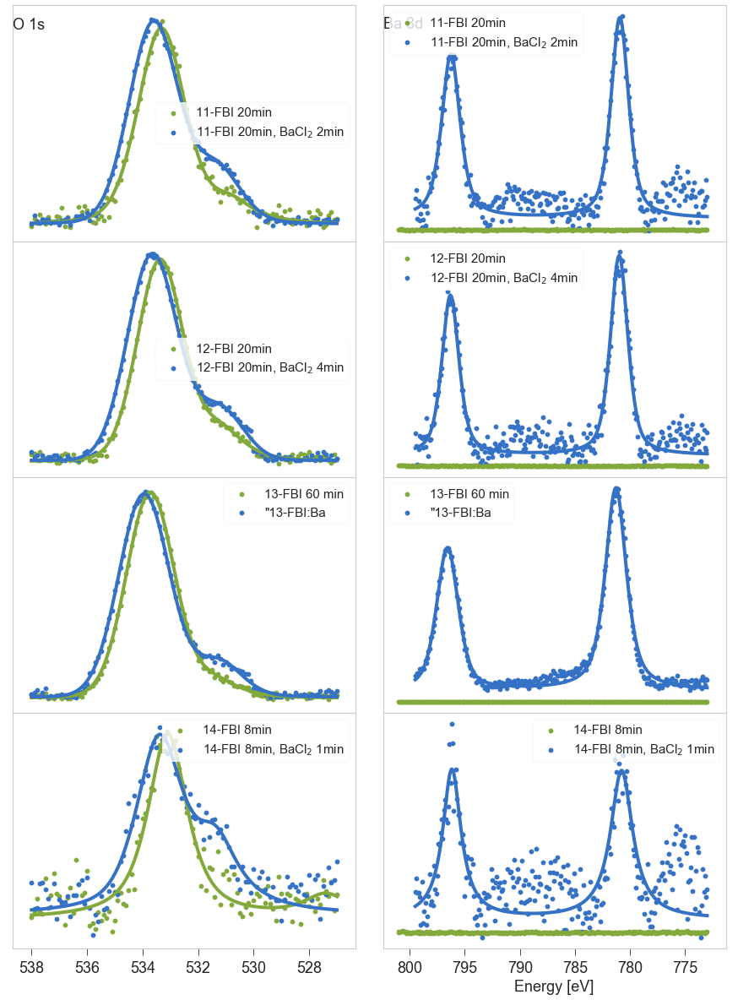

In [17]:
fig, ax = plt.subplots(4, 2, sharex=False, figsize=(12, 16), )
regs = ['O_1s', 'Ba_3d']
seps = [532, 790]
r = 'O_1s'
for i, z in enumerate(zip(xnfbi,xnba)):
    for xp in z:
        Fn = XPFit(xp, region=r)
        Fn.preset_pars(key='v1_sigma', val=1)
        Fn.double_voigt(sepPt=seps[0])
        plot_fit_result(xp, r, fitRes=xp.fit[r], ax=ax[i][0], flag_fill=False, plot_comps=False)
        Fn.set_areas()
        ax[i][0].legend()
    ax[i][0].set(yticks=[])#, ylim=tuple([yl * 1.2 for yl in ax[i][j].get_ylim()]))
    ax[i][0].invert_xaxis()
ax[0][0].text(s=r.replace('_', ' '), x=(ax[0][0].get_xlim()[0]), y=(ax[0][0].get_ylim()[1]*0.9))

r = 'Ba_3d'

for i, z in enumerate(zip(xpfbi, xpba)):
    for xp in z:
        Fn = XPFit(xp, region=r)
        Fn.double_voigt(sepPt=seps[1])
        plot_fit_result(xp, r, fitRes=xp.fit[r], ax=ax[i][1], flag_fill=False, plot_comps=False)
        Fn.set_areas()
        ax[i][1].legend()
    ax[i][1].set( yticks=[])
    ax[i][1].invert_xaxis()
ax[0][1].text(s=r.replace('_', ' '), x=(ax[0][1].get_xlim()[0]), y=(ax[0][1].get_ylim()[1]*0.9))
    
plt.tight_layout(w_pad=0.5, h_pad=0.5, pad=0.1)
ax[i][1].set(xlabel='Energy [eV]', ylabel='')
plt.subplots_adjust(hspace=.0)
plt.subplots_adjust(wspace=.08)
# plt.gcf().savefig('/Users/pabloherrero/Dropbox/phd/papers/fbi_cu_sublim_v2/fits_o1s.png', dpi=200)

In [233]:
ax[0][1].get_ylim()[1]*0.9

372.01151489301577

## N 1s

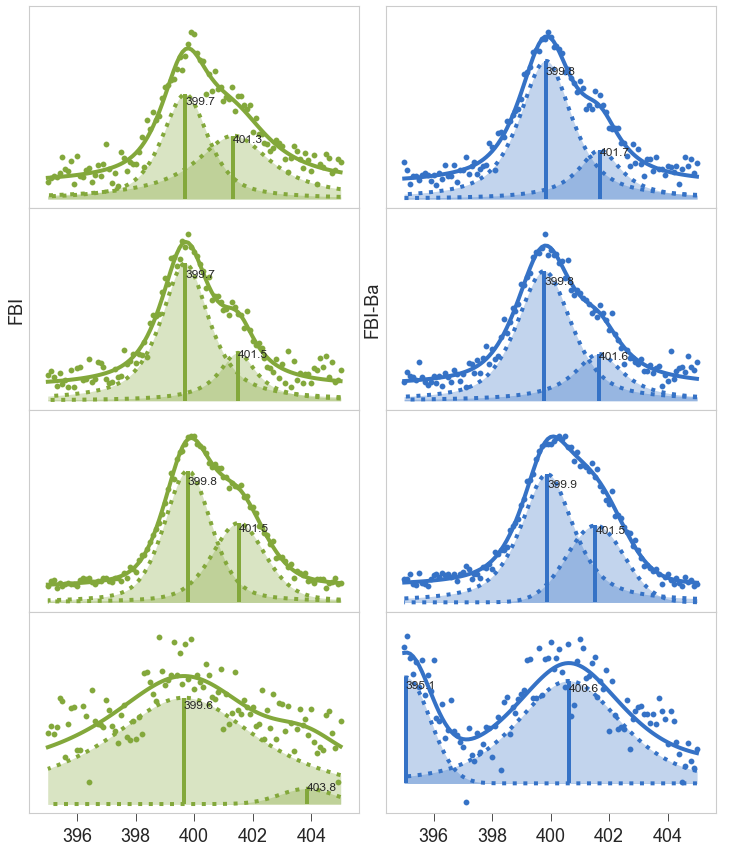

In [20]:
fig, ax = plt.subplots(4, 2, sharex=True, figsize=(10, 12 ), )
(ax1, ax2) = ax.T
region = 'N_1s'

for i,xp in enumerate(xpfbi):
    Fn = XPFit(xp, region=region)
    # Fn.preset_pars(key='v1_amplitude', val=300)

    Fn.double_voigt(sepPt=401)
    plot_fit_result(xp, region, fitRes=xp.fit[region], ax=ax1[i], flag_fill=True)
    ax1[i].set( yticks=[], ylim=tuple([yl * 1.1 for yl in ax1[i].get_ylim()]))
    
    Fn.set_areas()
ax1[1].set(ylabel='FBI')

for i,xp in enumerate(xpba):
    Fn = XPFit(xp, region=region)

    Fn.double_voigt(sepPt=400)
    plot_fit_result(xp, region, fitRes=xp.fit[region], ax=ax2[i], flag_fill=True)

    ax2[i].invert_xaxis()
    ax2[i].set( yticks=[], ylim=tuple([yl * 1.1 for yl in ax2[i].get_ylim()]))
    Fn.set_areas()
    ax2[i].set_xlabel('Energy [eV]')
ax2[1].set(ylabel='FBI-Ba')
plt.tight_layout(w_pad=0.5, h_pad=0.5, pad=0.1)
ax2[i].set(xlabel='', ylabel='')
plt.subplots_adjust(hspace=.0)
plt.subplots_adjust(wspace=.08)
# plt.gcf().savefig('/Users/pabloherrero/Dropbox/phd/papers/fbi_cu_sublim_v2/fits_n1s.png', dpi=200)

## C 1s

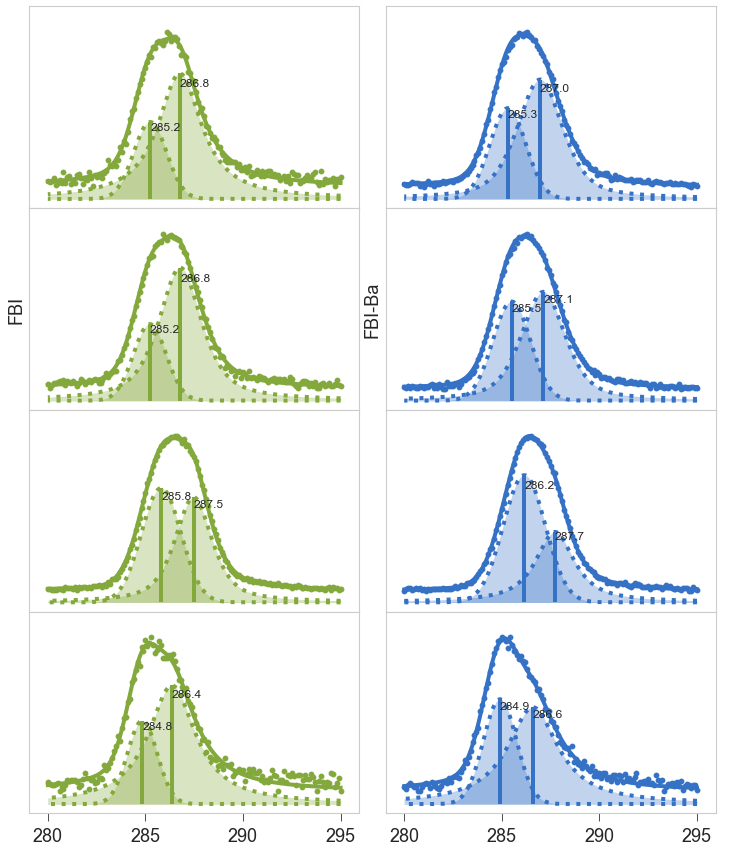

In [21]:
fig, ax = plt.subplots(4, 2, sharex=True, figsize=(10, 12 ), )
(ax1, ax2) = ax.T
region = 'C_1s'

for i,xp in enumerate(xpfbi):
    Fn = XPFit(xp, region=region)
    # Fn.preset_pars(key='v1_amplitude', val=300)

    Fn.double_voigt(sepPt=286.9)
    plot_fit_result(xp, region, fitRes=xp.fit[region], ax=ax1[i], flag_fill=True)

    ax1[i].set( yticks=[], ylim=tuple([yl * 1.1 for yl in ax1[i].get_ylim()]))

    Fn.set_areas()
ax1[1].set(ylabel='FBI')

for i,xp in enumerate(xpba):
    Fn = XPFit(xp, region=region)

    Fn.double_voigt(sepPt=286.9)
    plot_fit_result(xp, region, fitRes=xp.fit[region], ax=ax2[i], flag_fill=True)

    ax2[i].invert_xaxis()
    ax2[i].set( yticks=[], ylim=tuple([yl * 1.1 for yl in ax2[i].get_ylim()]))
    Fn.set_areas()
    ax2[i].set_xlabel('Energy [eV]')
plt.tight_layout(w_pad=0.5, h_pad=0.5, pad=0.1)
ax2[1].set(ylabel='FBI-Ba')
ax2[i].set(xlabel='', ylabel='')
plt.subplots_adjust(hspace=.0)
plt.subplots_adjust(wspace=.08)

# plt.gcf().savefig('/Users/pabloherrero/Dropbox/phd/papers/fbi_cu_sublim_v2/fits_c1s.png', dpi=200)

## Cl 2p

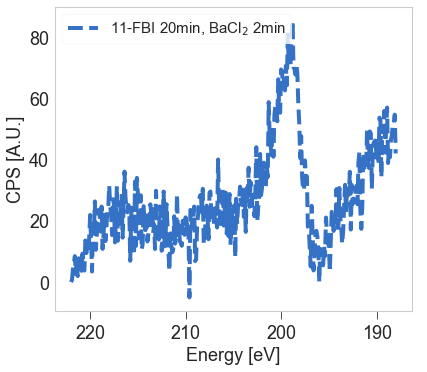

In [22]:
region = 'Cl_2p'
plot_region(xpba[0], region)

XPS_experiment(path='/Users/pabloherrero/sabat/xps_spectra/FBI_Cu/FBI_subl/2021_02_01_Cu/proc/20210201_11-Cu_FBI_subl_20min_BaCl2_2min.uxy', delimiters="([42, 351, 720, 899, 1078, 1207, 1346, 2579], [281, 341, 151, 151, 101, 111, 1205, 341], ['Ba_3d', 'Cl_2p', 'Ba_4d', 'C_1s', 'N_1s', 'O_1s', 'overview_', 'Cu_2p'])", name='11-FBI 20min, BaCl$_2$ 2min', label='20210201_11-Cu_FBI_subl_20min_BaCl2_2min', date='20.21.0201', other_meta='11-Cu_FBI_subl_20min_BaCl2_2min', dfx=range       Ba_3d             Cl_2p            Ba_4d              C_1s  \
properties energy     counts energy    counts energy     counts energy   
0           799.5  36.684595  222.0  0.000000  100.0  2580.7353  295.0   
1           799.4  52.873754  221.9  0.692983   99.9  2587.6471  294.9   
2           799.3  -0.868196  221.8  4.214504   99.8  2568.5294  294.8   
3           799.2  31.923238  221.7  6.443532   99.7  2585.9559  294.7   
4           799.1  -4.120363  221.6  8.494492   99.6  2578.5294  294.6   
...     

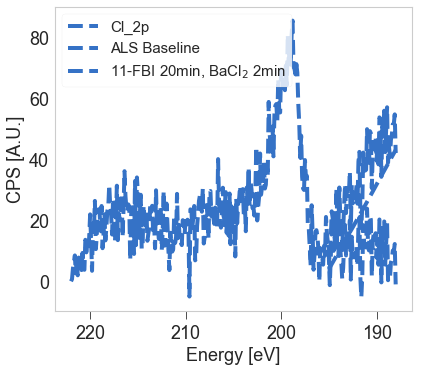

In [23]:
fix_tail_bg(xpba[0], 'Cl_2p', eup=195, inplace=True)

[Text(1102.0608695652174, 0.5, ''), Text(0.5, 27.4, '')]

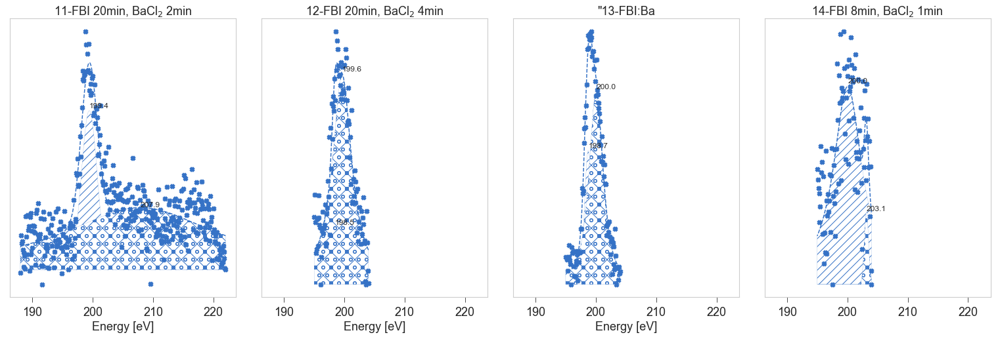

In [25]:
fig,  ax2 = plt.subplots(1, 4, sharex=True, figsize=(21, 7), )
region = 'Cl_2p'

for i,xp in enumerate(xpba):
    Fn = XPFit(xp, region=region)

    Fn.double_voigt(sepPt=199)
    Fn.plot( ax = ax2[i], marker='x', ls = 'dashed')

    ax2[i].set(title=xp.name, yticks=[])
    Fn.set_areas()
    ax2[i].set_xlabel('Energy [eV]')
plt.tight_layout(w_pad=0.5, h_pad=0.5, pad=0.1)
ax2[i].get_legend().remove()
ax2[i].set(xlabel='', ylabel='')
# plt.gcf().savefig('/Users/pabloherrero/Dropbox/phd/papers/fbi_cu_sublimation/fits_n1s.png', dpi=200)

## Ba 3d

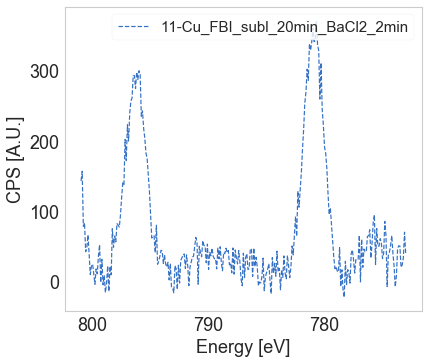

In [74]:
plot_region(xpba[0], region)

ValueError: Offset 0 (index 0) out of bounds

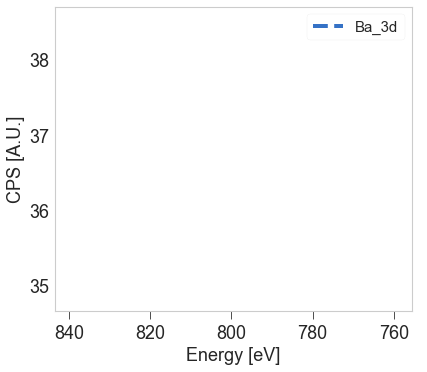

In [26]:
for xp in xpba:
    fix_tail_bg(xp, 'Ba_3d', edw=799.5, inplace=True);

[Text(1065.9608695652175, 0.5, ''), Text(0.5, 27.4, '')]

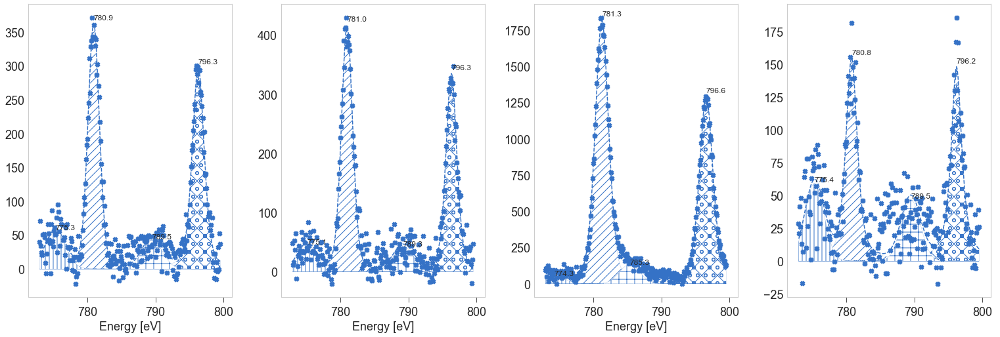

In [28]:
fig,  ax2 = plt.subplots(1, 4, sharex=True, figsize=(21, 7), )
region = 'Ba_3d'
parg1 = [100, 775, 1]
bounds1 = [(50, 500), (774,776), (0.8,1.5)]

parg2 = [100, 792, 1]
bounds2 = [(50, 500), (785,793), (0.8,1.5)]

for i,xp in enumerate(xpba):
    Fn = XPFit(xp, region=region)

    fitv = Fn.double_voigt(sepPt=790)
    fitvg = Fn.gauss_shoulder(fitv, par_g = parg1, bounds_g= bounds1)
    Fn.gauss_shoulder(fitvg, Ng=2, par_g = parg2, bounds_g= bounds2)
    
    Fn.plot( ax = ax2[i], marker='x', ls = 'dashed')

#     ax2[i].set(title=xp.name, yticks=[])
    Fn.set_areas()
    ax2[i].set_xlabel('Energy [eV]')
plt.tight_layout(w_pad=0.5, h_pad=0.5, pad=0.1)
ax2[i].get_legend().remove()
ax2[i].set(xlabel='', ylabel='')
# plt.gcf().savefig('/Users/pabloherrero/Dropbox/phd/papers/fbi_cu_sublimation/fits_n1s.png', dpi=200)

## Ba 4d

KeyError in 'Ba_4d'


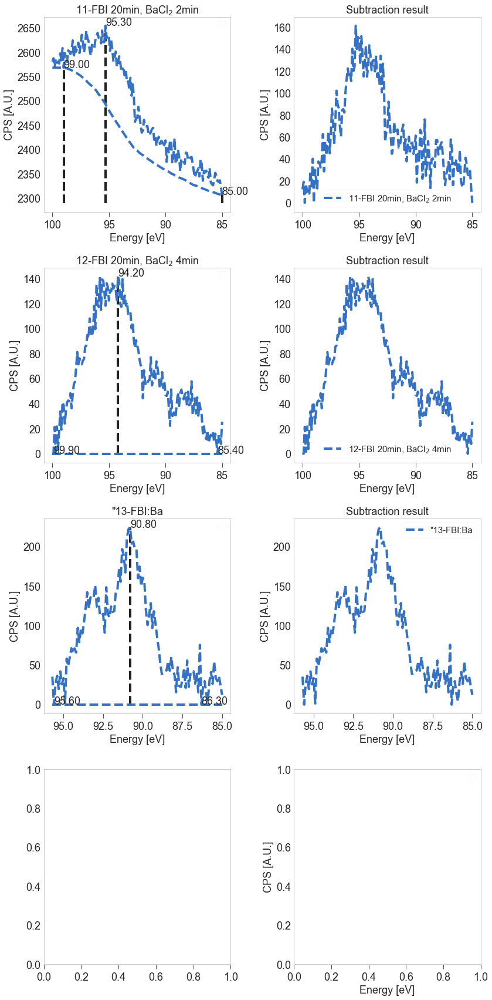

In [29]:
xpba = region_bg_subtract(xpba, region='Ba_4d')

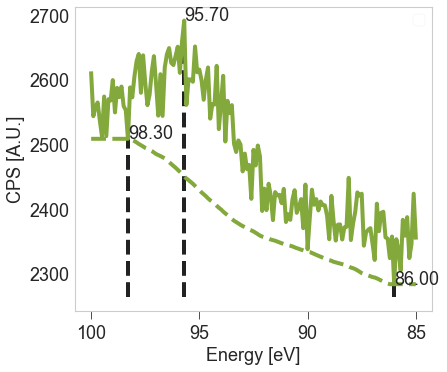

In [30]:
xpfbi[0] = subtract_shirley_bg(xpfbi[0], 'Ba_4d', maxit=40 )

[Text(1012.1529411764707, 0.5, ''), Text(0.5, 27.400000000000055, '')]

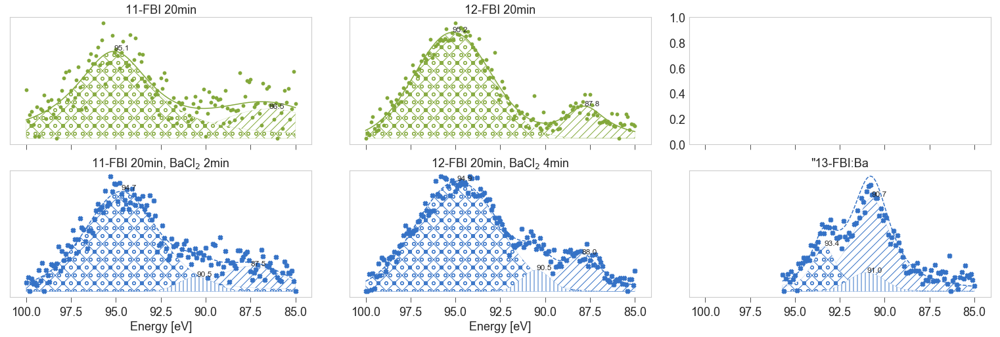

In [31]:
fig, (ax1, ax2) = plt.subplots(2, 3, sharex=True, figsize=(21, 7), )
region = 'Ba_4d'
parg1 = [100, 91, 1]
bounds1 = [(50, 500), (90.5,91.5), (0.8,1.5)]

# parg2 = [100, 792, 1]
# bounds2 = [(50, 500), (785,793), (0.8,1.5)]

for i,xp in enumerate(xpfbi[:2]):
    Fn = XPFit(xp, region=region)
    # Fn.preset_pars(key='v1_amplitude', val=300)

    Fn.double_voigt(sepPt=92.5)
    Fn.plot( ax = ax1[i])
    ax1[i].set(title=xp.name, yticks=[])
    Fn.set_areas()

for i,xp in enumerate(xpba):
    Fn = XPFit(xp, region=region)

    fitv = Fn.double_voigt(sepPt=92.5)
    fitvg = Fn.gauss_shoulder(fitv, par_g = parg1, bounds_g= bounds1)
#     Fn.gauss_shoulder(fitvg, Ng=2, par_g = parg2, bounds_g= bounds2)
    
    Fn.plot( ax = ax2[i], marker='x', ls = 'dashed')

    ax2[i].set(title=xp.name, yticks=[])
    Fn.set_areas()
    ax2[i].set_xlabel('Energy [eV]')
plt.tight_layout(w_pad=0.5, h_pad=0.5, pad=0.1)
ax2[i].get_legend().remove()
ax2[i].set(xlabel='', ylabel='')
# plt.gcf().savefig('/Users/pabloherrero/Dropbox/phd/papers/fbi_cu_sublimation/fits_n1s.png', dpi=200)

# Include samples 13-8 min BaCl2 and 13-12 min BaCl2

In [47]:
path = '/Users/pabloherrero/sabat/xps_spectra/FBI_Cu/FBI_subl/2021_02_*/**/*.uxy'

files = glob.glob(path, recursive=True)
files.sort()
files_new = []
for f in files:
    if '/proc' in f:
        files_new.append(f)
files = files_new
files = files[6:10]
files

['/Users/pabloherrero/sabat/xps_spectra/FBI_Cu/FBI_subl/2021_02_03_Cu/proc/20210203_13-Cu_FBI_subl_60min.uxy',
 '/Users/pabloherrero/sabat/xps_spectra/FBI_Cu/FBI_subl/2021_02_03_Cu/proc/20210203_13-Cu_FBI_subl_60min_BaCl2_04min.uxy',
 '/Users/pabloherrero/sabat/xps_spectra/FBI_Cu/FBI_subl/2021_02_03_Cu/proc/20210203_13-Cu_FBI_subl_60min_BaCl2_08min.uxy',
 '/Users/pabloherrero/sabat/xps_spectra/FBI_Cu/FBI_subl/2021_02_03_Cu/proc/20210203_13-Cu_FBI_subl_60min_BaCl2_12min.uxy']

In [48]:
progba = []
colors = ['r', 'c', 'purple', 'y']
names = ['13-FBI 60 min', '13-FBI:Ba = 1:1', '13-FBI:Ba = 1:2', '13-FBI:Ba = 1:3']
for i,f in enumerate(files):
    progba.append(read_processed_xp(f))
    progba[-1].name = names[i]
    progba[-1].color = colors[i]        

## C 1s

[Text(548.1090909090908, 0.5, ''), Text(0.5, 27.400000000000055, '')]

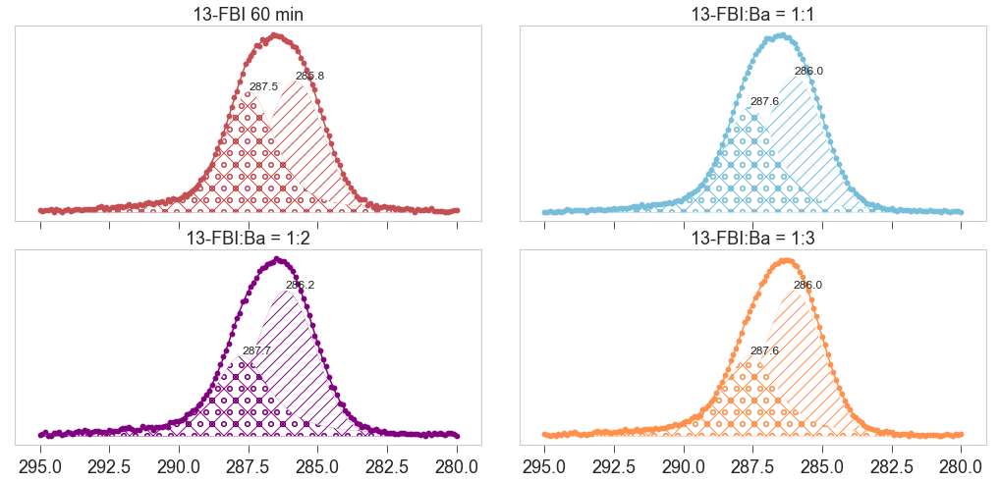

In [49]:
fig, ax = plt.subplots(2, 2, sharex=True, figsize=(14, 7), )
region = 'C_1s'
# 
for i,xp in enumerate(progba):
    j, k = i//2, i%2
    Fn = XPFit(xp, region=region)

    Fn.double_voigt(sepPt=286.9)
    Fn.plot( ax = ax[j][k] )
    ax[j][k].set(title=xp.name, yticks=[])
    Fn.set_areas()
ax[1][k].invert_xaxis()
# ax[0].set(ylabel='FBI-Ba')
plt.tight_layout(w_pad=0.5, h_pad=0.5, pad=0.1)
ax[j][k].get_legend().remove()
ax[j][k].set(xlabel='', ylabel='')

## N 1s

[Text(548.1090909090908, 0.5, ''), Text(0.5, 27.400000000000055, '')]

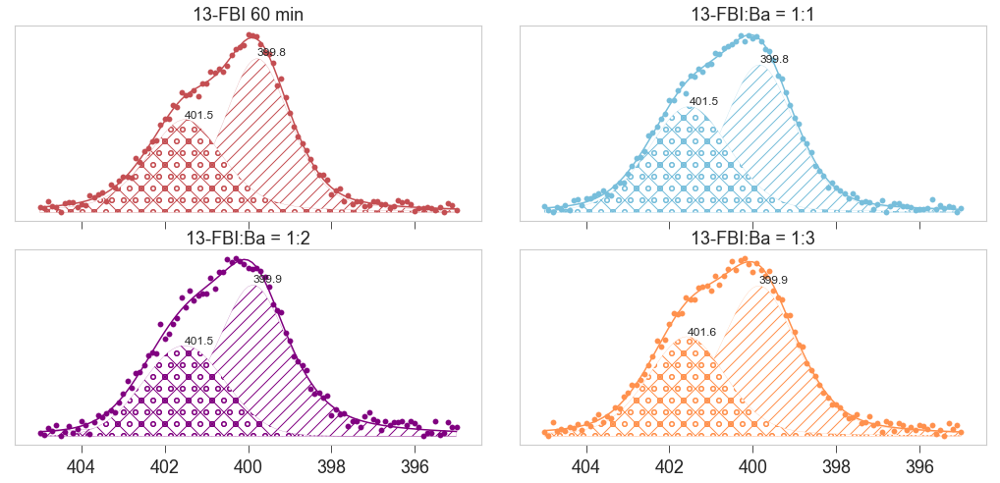

In [50]:
fig, ax = plt.subplots(2, 2, sharex=True, figsize=(14, 7), )
region = 'N_1s'
# 
for i,xp in enumerate(progba):
    j, k = i//2, i%2
    Fn = XPFit(xp, region=region)

    Fn.double_voigt(sepPt=401)
    Fn.plot( ax = ax[j][k] )
    ax[j][k].set(title=xp.name, yticks=[])
    Fn.set_areas()
ax[1][k].invert_xaxis()
# ax[0].set(ylabel='FBI-Ba')
plt.tight_layout(w_pad=0.5, h_pad=0.5, pad=0.1)
ax[j][k].get_legend().remove()
ax[j][k].set(xlabel='', ylabel='')

In [13]:
progba[0].area['N_1s_v1_'], progba[0].area['N_1s_v2_']

(0.5978771960555697, 0.40212280394443023)

In [15]:
progba[1].area['N_1s_v1_'], progba[1].area['N_1s_v2_']

(0.5624650861600138, 0.4375349138399862)

In [14]:
progba[-1].area['N_1s_v1_'], progba[-1].area['N_1s_v2_']

(0.616822980565921, 0.383177019434079)

## Cl 2p

In [51]:
trim_spectra(progba[-1], progba[0], region='Cl_2p', inplace=True);

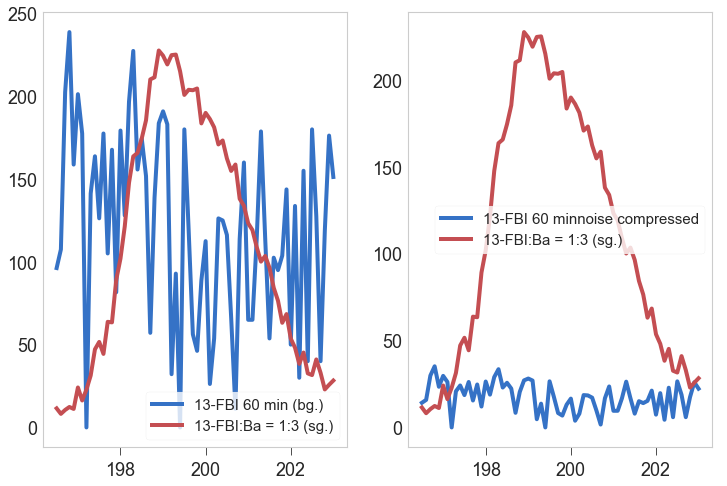

In [52]:
compress_noisy_region(progba[0], progba[-1], 'Cl_2p', inplace=True);

[Text(548.1090909090908, 0.5, ''), Text(0.5, 27.400000000000055, '')]

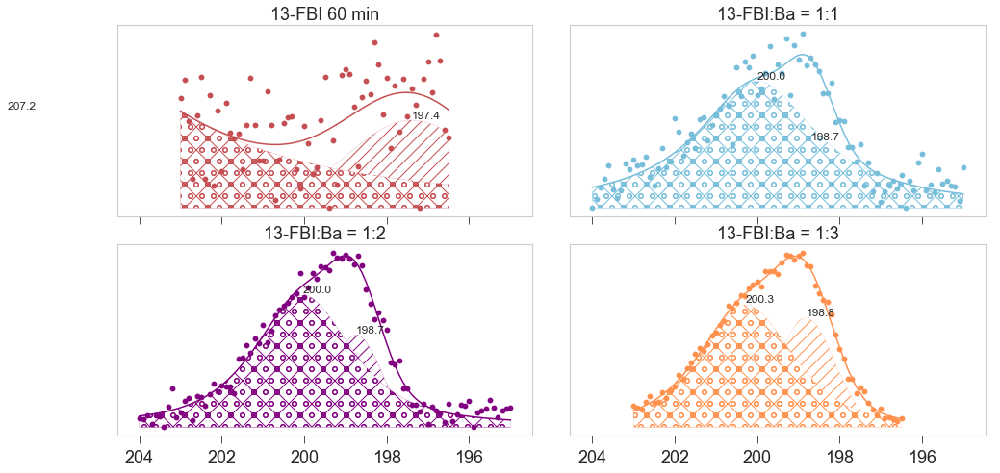

In [53]:
fig, ax = plt.subplots(2, 2, sharex=True, figsize=(14, 7), )
region = 'Cl_2p'
# 
for i,xp in enumerate(progba):
    j, k = i//2, i%2
    Fn = XPFit(xp, region=region)

    Fn.double_voigt(sepPt=199)
    Fn.plot( ax = ax[j][k] )
    ax[j][k].set(title=xp.name, yticks=[])
    Fn.set_areas()
ax[1][k].invert_xaxis()
# ax[0].set(ylabel='FBI-Ba')
plt.tight_layout(w_pad=0.5, h_pad=0.5, pad=0.1)
ax[j][k].get_legend().remove()
ax[j][k].set(xlabel='', ylabel='')

## Cu 2p

[Text(548.1090909090908, 0.5, ''), Text(0.5, 27.400000000000055, '')]

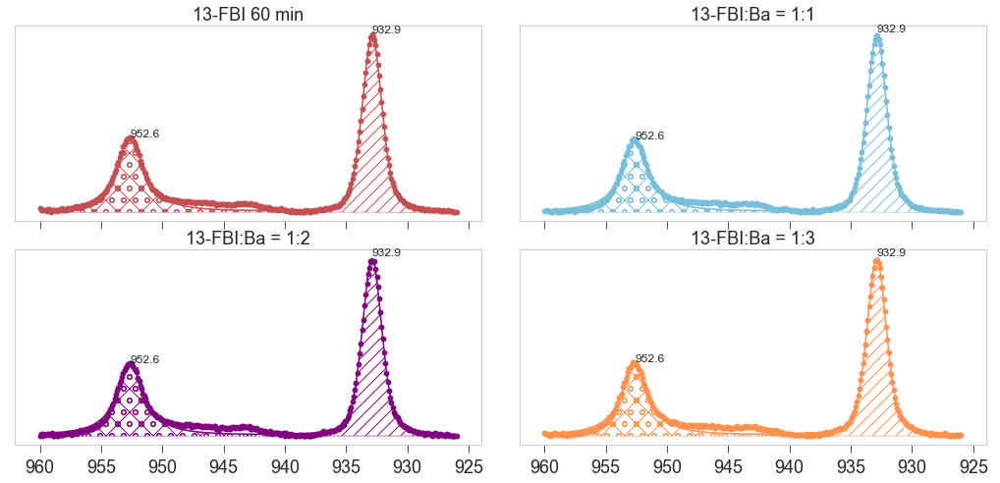

In [54]:
fig, ax = plt.subplots(2, 2, sharex=True, figsize=(14, 7), )
region = 'Cu_2p'
# 
for i,xp in enumerate(progba):
    j, k = i//2, i%2
    Fn = XPFit(xp, region=region)

    Fn.double_voigt(sepPt=950)
    Fn.plot( ax = ax[j][k] )
    ax[j][k].set(title=xp.name, yticks=[])
    Fn.set_areas()
ax[1][k].invert_xaxis()
# ax[0].set(ylabel='FBI-Ba')
plt.tight_layout(w_pad=0.5, h_pad=0.5, pad=0.1)
ax[j][k].get_legend().remove()
ax[j][k].set(xlabel='', ylabel='')

## O 1s

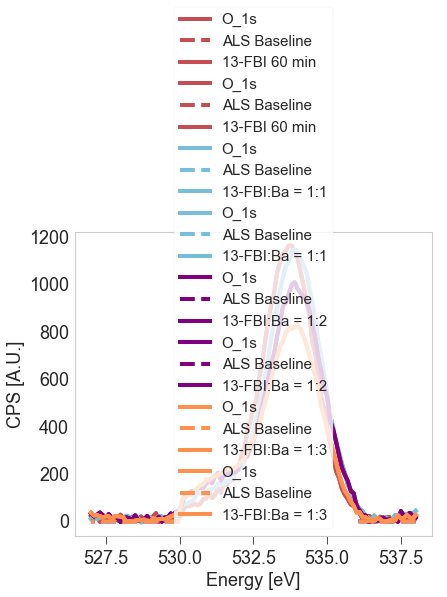

In [59]:
for xp in progba:
    fix_tail_bg(xp, 'O_1s', edw=536, inplace=True);
    fix_tail_bg(xp, 'O_1s', eup=530, inplace=True);

[Text(390.36363636363626, 0.5, ''), Text(0.5, 18.40000000000005, '')]

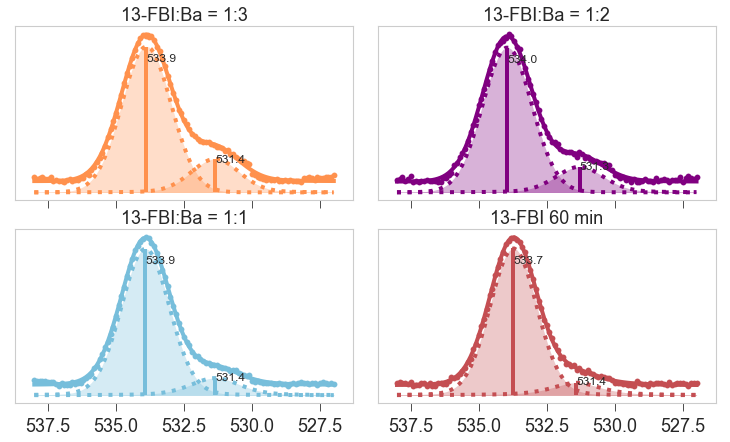

In [60]:
fig, ax = plt.subplots(2, 2, sharex=True, figsize=(10, 6), )
region = 'O_1s'
# 
for i,xp in enumerate(progba[::-1]):
    j, k = i//2, i%2
    Fn = XPFit(xp, region=region)

    Fn.double_voigt(sepPt=532)
    plot_fit_result(xp, region, fitRes=xp.fit[region], ax=ax[j][k], flag_fill=True)
    ax[j][k].set(title=xp.name, yticks=[])
    Fn.set_areas()
ax[1][k].invert_xaxis()
# ax[0].set(ylabel='FBI-Ba')
plt.tight_layout(w_pad=0.5, h_pad=0.5, pad=0.1)
# ax[j][k].get_legend().remove()
ax[j][k].set(xlabel='', ylabel='')
# plt.gcf().savefig('/Users/pabloherrero/Dropbox/phd/papers/fbi_cu_sublim_v2/fits_o1s_moreBa.png', dpi=200)

In [39]:
for xp in progba:
    print(xp.area['O_1s_v2_'] / xp.area['O_1s_v1_'] )

9.660349912920216
7.58487448324811
5.48913848712414
4.309290181029673


In [40]:
for xp in progba:
    print(np.sqrt(xp.area['O_1s'])/xp.area['O_1s'])

0.01893124844284448
0.01863612821592151
0.01939411237188549
0.020827607514777576


In [139]:
area_small = []
ea_small = []
area_big = []
ea_big = []
for xp in progba:
    print(xp.area['O_1s_v2_'], xp.area['O_1s_v1_'] )
    area_small.append(xp.area['O_1s_v1_'])
    ea_small.append(np.sqrt(xp.area['O_1s'])/xp.area['O_1s'] * xp.area['O_1s_v1_'] ) 
    area_big.append(xp.area['O_1s_v2_'])
    ea_big.append(np.sqrt(xp.area['O_1s'])/xp.area['O_1s'] * xp.area['O_1s_v2_'] ) 

0.9061944487593215 0.0938055512406785
0.883516060490887 0.11648393950911293
0.8458963386304335 0.15410366136956657
0.8116509051298337 0.18834909487016624


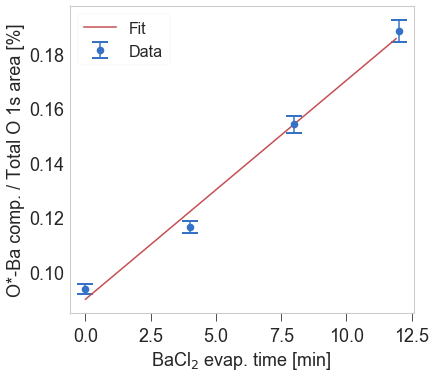

In [146]:
ba2n = np.array([0, 4, 8, 12])

plt.errorbar(ba2n, area_small, yerr=ea_small,
             fmt='o', capsize=8, markeredgewidth=2, label = 'Data')

model = np.polyfit(ba2n, area_small, 1)
xf = np.arange(ba2n[0], ba2n[-1], 0.1)
predict = np.poly1d(model)
plt.plot(xf, predict(xf), '-r', label='Fit')
plt.xlabel('BaCl$_2$ evap. time [min] ')
plt.ylabel('O*-Ba comp. / Total O 1s area [%]')
plt.legend(fontsize=16)
plt.tight_layout()
plt.savefig('/Users/pabloherrero/Dropbox/phd/drafts/fbi_cu_sublimation/v3/o_shoulder_vs_ba.png', dpi=100)

Text(0, 0.5, 'O 1s v2 relative area')

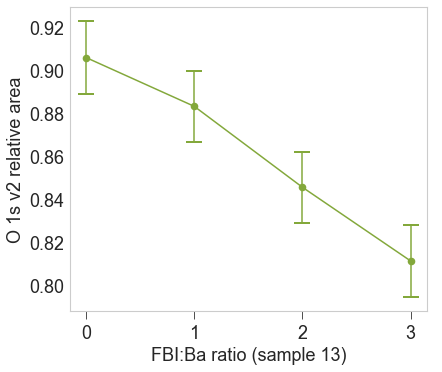

In [44]:
baratio = [0, 1, 2, 3]
plt.errorbar(baratio, area_big, yerr=ea_big,
              fmt='-og', capsize=8, markeredgewidth=2)

plt.xlabel('FBI:Ba ratio (sample 13)')
plt.ylabel('O 1s v2 relative area')

In [252]:
area_small

[0.09380556340284829,
 0.11648394518911066,
 0.15410365746901303,
 0.18834909946113126]

In [ ]:
ClBa = [1.58, 1.42, 0.57, 0.46, 0.50]

## Ba 4d

In [198]:
def insert_dfx_region(xp: XPS_experiment, xpFrom:XPS_experiment, region: str, inplace:bool = False):
    """Insert a region from one dfx (xpFrom) into another (xp) for which it is missing"""
    sourcedf = xp.dfx
    newreg = xpFrom.dfx[region]
    names = list(sourcedf.columns.levels[0].values)
    dfnew = pd.DataFrame()
    frames = []
    
    for n in names:    # Loop over regions
        x = sourcedf[n].energy.dropna()
        frames.append( pd.DataFrame([x, sourcedf[n].counts]).T )

    frames.append(pd.DataFrame([newreg.energy, newreg.counts]).T)
    names.append(region)
    dfnew = pd.concat(frames, axis=1)

    mi = pd.MultiIndex.from_product([names, np.array(['energy', 'counts'])])
    mi.to_frame()
    dfnew.columns = mi
    if inplace:
        xp.dfx = dfnew
        return xp
    else:
        xpNew = deepcopy(xp)
        xpNew.dfx = dfnew
    return xpNew

In [42]:
insert_dfx_region(xp=progba[0], xpFrom=xpfbi[1], region='Ba_4d', inplace=True);

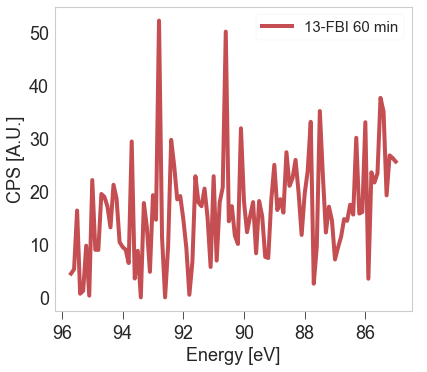

In [56]:
plot_region(progba[0], 'Ba_4d')

In [46]:
progba[0].dfx

Ba_3d          Ba_4d              C_1s           Cl_2p             \
     energy  counts energy     counts energy   counts energy     counts   
0     801.0  623.75   95.7   4.474497  295.0  14.5000  203.0  22.306545   
1     800.9  347.50   95.6   5.291366  294.9   5.7500  202.9  25.993577   
2     800.8  388.75   95.5  16.382451  294.8  17.1429  202.8  17.513403   
3     800.7  548.75   95.4   0.683943  294.7  15.4286  202.7   5.899252   
4     800.6  546.25   95.3   1.240301  294.6  24.0358  202.6  18.803864   
...     ...     ...    ...        ...    ...      ...    ...        ...   
1200    NaN     NaN    NaN        NaN    NaN      NaN    NaN        NaN   
1201    NaN     NaN    NaN        NaN    NaN      NaN    NaN        NaN   
1202    NaN     NaN    NaN        NaN    NaN      NaN    NaN        NaN   
1203    NaN     NaN    NaN        NaN    NaN      NaN    NaN        NaN   
1204    NaN     NaN    NaN        NaN    NaN      NaN    NaN        NaN   

      Cu_2p            N_1s            O_1s                overview_           \
     energy   counts energy   counts energy     counts        energy   counts   
0     960.0  1427.50  405.0   6.2895  538.0  23.201590  1.200000e+03  30620.0   
1     959.9   851.25  404.9   4.6842  537.9  28.738252  1.199000e+03  30790.0   
2     959.8   736.25  404.8  14.2631  537.8  20.681167  1.198000e+03  30285.0   
3     959.7   706.25  404.7   8.1842  537.7  21.561432  1.197000e+03  30605.0   
4     959.6   710.00  404.6   5.8552  537.6  13.097701  1.196000e+03  30665.0   
...     ...      ...    ...      ...    ...        ...           ...      ...   
1200    NaN      NaN    NaN      NaN    NaN        NaN -2.273737e-13    775.0   
1201    NaN      NaN    NaN      NaN    NaN        NaN -1.000000e+00    655.0   
1202    NaN      NaN    NaN      NaN    NaN        NaN -2.000000e+00    570.0   
1203    NaN      NaN    NaN      NaN    NaN        NaN -3.000000e+00    580.0   
1204    NaN      NaN    NaN      NaN    NaN        NaN -4.000000e+00    625.0   

      Ba_4d             
     energy     counts  
0     100.0   0.000000  
1      99.9   6.491341  
2      99.8   3.902555  
3      99.7  20.348000  
4      99.6  27.059820  
...     ...        ...  
1200    NaN        NaN  
1201    NaN        NaN  
1202    NaN        NaN  
1203    NaN        NaN  
1204    NaN        NaN  

[1205 rows x 18 columns]

[Text(512.5090909090908, 0.5, ''), Text(0.5, 27.400000000000055, '')]

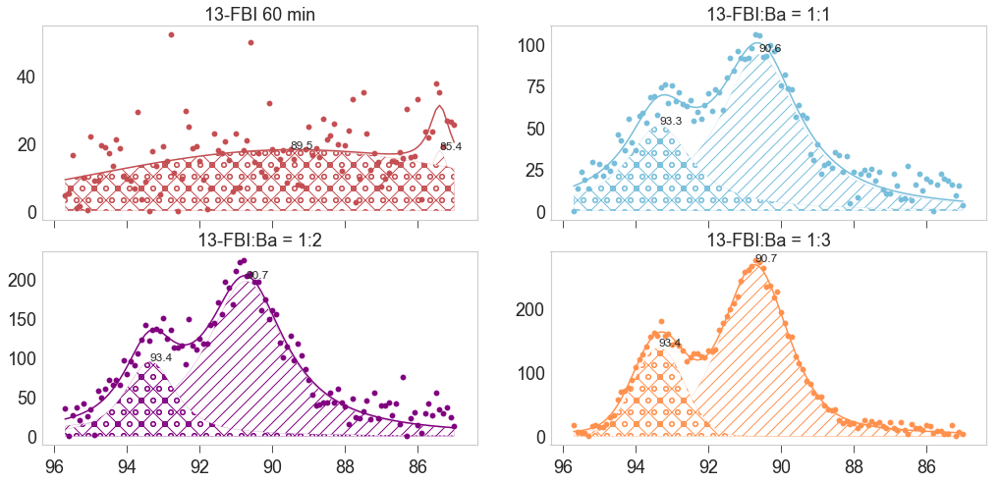

In [57]:
region = 'Ba_4d'
parg1 = [100, 87, 1]
bounds1 = [(50, 500), (87.5,91.5), (0.8,1.5)]
fig, ax = plt.subplots(2, 2, sharex=True, figsize=(14, 7), )
# 
for i,xp in enumerate(progba):
    j, k = i//2, i%2
    Fn = XPFit(xp, region=region)

    Fn.double_voigt(sepPt=92.5)
    Fn.plot( ax = ax[j][k] )
    ax[j][k].set(title=xp.name)#, yticks=[])
    Fn.set_areas()
ax[1][k].invert_xaxis()
# ax[0].set(ylabel='FBI-Ba')
plt.tight_layout(w_pad=0.5, h_pad=0.5, pad=0.1)
ax[j][k].get_legend().remove()
ax[j][k].set(xlabel='', ylabel='')
# plt.gcf().savefig('/Users/pabloherrero/Dropbox/phd/papers/fbi_cu_sublim_v2/fits_ba4d.png', dpi=200)

### Subtract fit components from FBI spureous peak

ValueError: If using all scalar values, you must pass an index

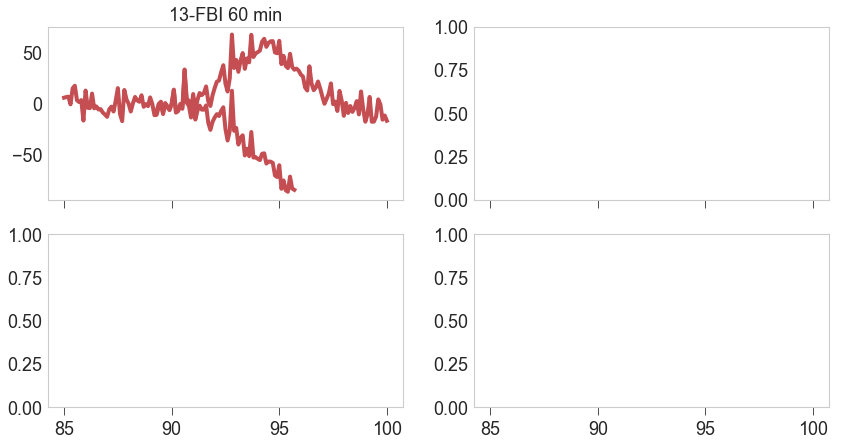

In [45]:
fig, ax = plt.subplots(2, 2, sharex=True, figsize=(14, 7), ) 
for i,xp in enumerate(progba):
    j, k = i//2, i%2
    x = xp.dfx[region].dropna().energy.values
    y = xp.dfx[region].dropna().counts.values

    ybg = progba[0].fit[region].best_fit
    ax[j][k].plot(x, y-ybg, color=xp.color)
    ax[j][k].set(title=xp.name)#, yticks=[])
    
    dfnew = pd.DataFrame({'energy' : x, 'counts' : y - ybg})
    xp.dfx[region] = dfnew
    
ax[1][k].invert_xaxis()
plt.tight_layout(w_pad=0.5, h_pad=0.5, pad=0.1)
ax[j][k].set(xlabel='', ylabel='')

[Text(502.0090909090908, 0.5, ''), Text(0.5, 27.400000000000055, '')]

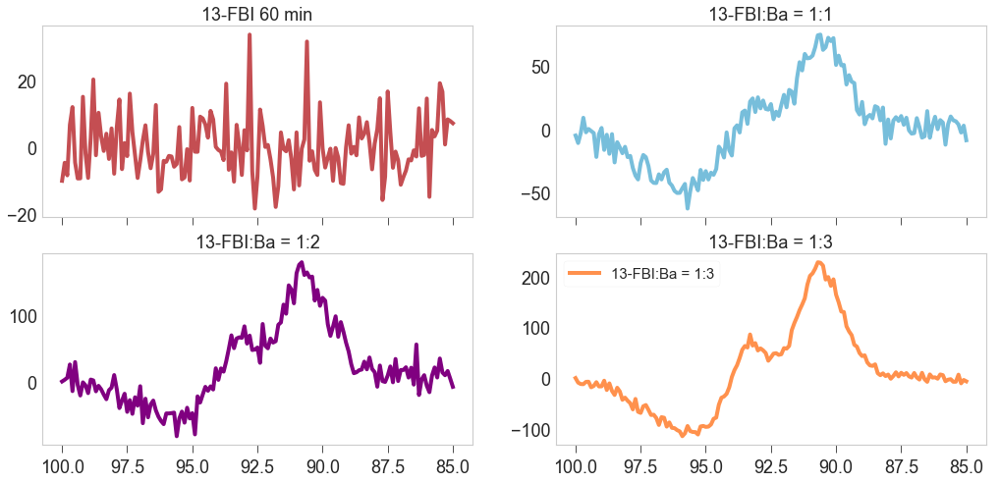

In [92]:
region = 'Ba_4d'
fig, ax = plt.subplots(2, 2, sharex=True, figsize=(14, 7), ) 
for i,xp in enumerate(progba):
    j, k = i//2, i%2
    
    plot_region(xp, region, ax=ax[j][k])
    ax[j][k].set(title=xp.name)#, yticks=[])
        
ax[1][k].invert_xaxis()
plt.tight_layout(w_pad=0.5, h_pad=0.5, pad=0.1)
ax[j][k].set(xlabel='', ylabel='')

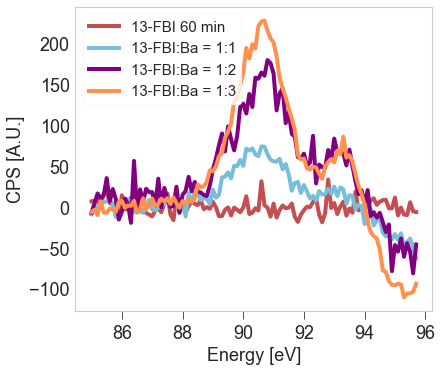

In [93]:
for xp in progba:
    crop_spectrum(xp, region, eup=95.7, inplace=True)
    plot_region(xp, region)

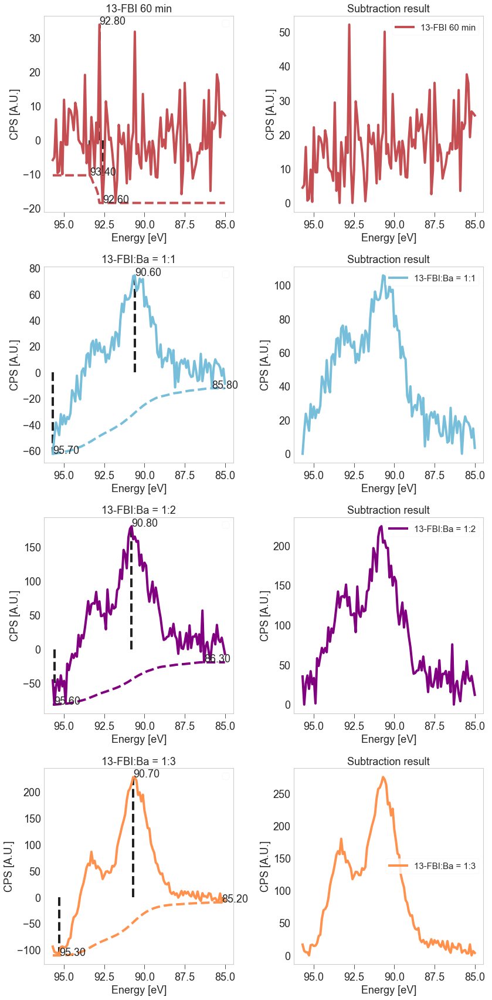

In [94]:
progba = region_bg_subtract(progba, region)

### Refit

[Text(512.5090909090908, 0.5, ''), Text(0.5, 27.400000000000055, '')]

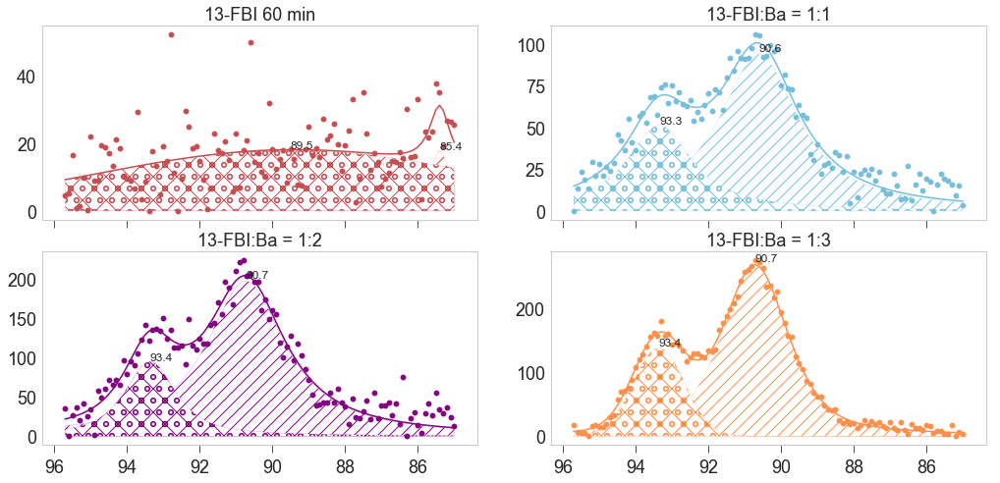

In [95]:
region = 'Ba_4d'
parg1 = [100, 87, 1]
bounds1 = [(50, 500), (87.5,91.5), (0.8,1.5)]
fig, ax = plt.subplots(2, 2, sharex=True, figsize=(14, 7), )
# 
for i,xp in enumerate(progba):
    j, k = i//2, i%2
    Fn = XPFit(xp, region=region)

    Fn.double_voigt(sepPt=92.5)
    Fn.plot( ax = ax[j][k] )
    ax[j][k].set(title=xp.name)#, yticks=[])
    Fn.set_areas()
ax[1][k].invert_xaxis()
# ax[0].set(ylabel='FBI-Ba')
plt.tight_layout(w_pad=0.5, h_pad=0.5, pad=0.1)
ax[j][k].get_legend().remove()
ax[j][k].set(xlabel='', ylabel='')
# plt.gcf().savefig('/Users/pabloherrero/Dropbox/phd/papers/fbi_cu_sublim_v2/fits_ba4d.png', dpi=200)

### Ba 4d + O 1s

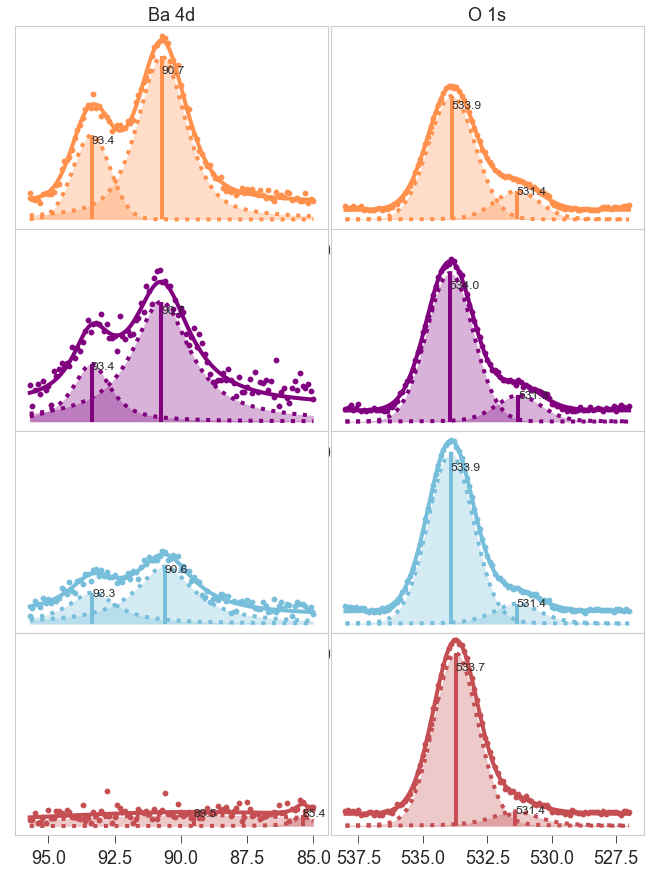

In [67]:
region = 'Ba_4d'
fig, ax = plt.subplots(4, 2, sharex=False, figsize=(9, 12), )

for i,xp in enumerate(progba[::-1]):
#     line = hatchplot_fit(xp, region, xp.fit['Ba_4d'], ax=ax[i][0]).lines
    plot_fit_result(xp, 'Ba_4d', fitRes=xp.fit['Ba_4d'], ax=ax[i][0], flag_fill=True)

    plot_fit_result(xp, 'O_1s', fitRes=xp.fit['O_1s'], ax=ax[i][1], flag_fill=True)

    if i == 0: yl1 = ax[i][0].get_ylim()
    ax[i][0].set(ylim=yl1, yticks=[])
    
    ax[i][0].invert_xaxis()
    ax[i][1].invert_xaxis()
    ax[i][0].set(xlabel='', ylabel='')
    ax[i][1].set(xlabel='', ylabel='')

#     ax[i][0].legend(line, (xp.name, None))
#     ax[i][1].legend(line, (xp.name, None))
    
yl2 = ax[2][1].get_ylim()
for i in range(4):
    ax[i][1].set(ylim=yl2, yticks=[])
    
ax[0][0].set_title('Ba 4d')
ax[0][1].set_title('O 1s')

plt.tight_layout(w_pad=0.5, h_pad=0.5, pad=0.1)
# ax[2][1].get_legend().remove()
# ax1[2].set(xlabel='', ylabel='')
plt.subplots_adjust(hspace=.0)
plt.subplots_adjust(wspace=.01)

# plt.gcf().savefig('/Users/pabloherrero/Dropbox/phd/papers/fbi_cu_sublim_v2/fits_ba4d.png', dpi=200)

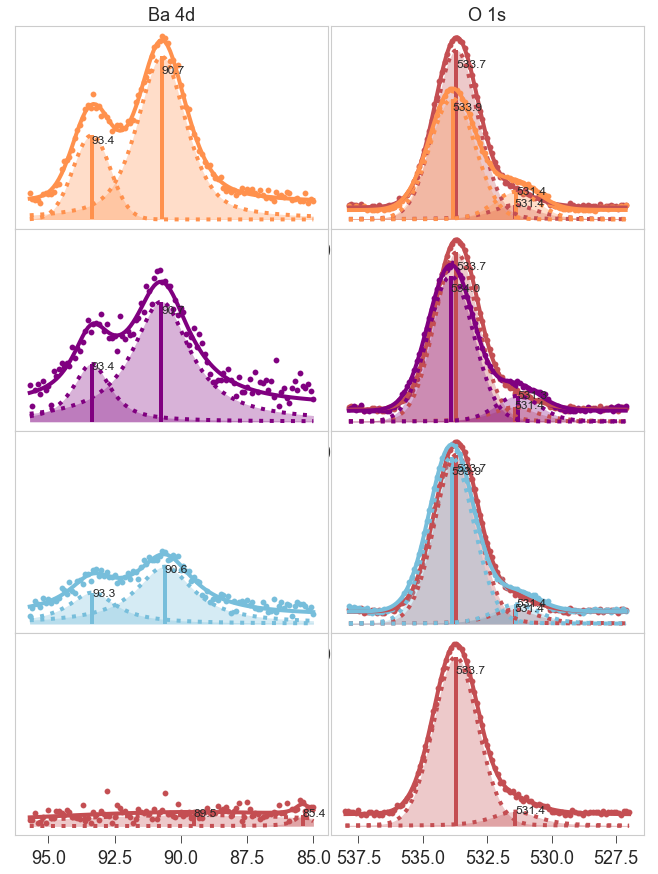

In [77]:
region = 'Ba_4d'
fig, ax = plt.subplots(4, 2, sharex=False, figsize=(9, 12), )

for i ,xp in enumerate(progba[::-1]):
#     line = hatchplot_fit(xp, region, xp.fit['Ba_4d'], ax=ax[i][0]).lines

    plot_fit_result(xp, 'Ba_4d', fitRes=xp.fit['Ba_4d'], ax=ax[i][0], flag_fill=True)
    if i < 3:    plot_fit_result(progba[0], 'O_1s', fitRes=progba[0].fit['O_1s'], ax=ax[i][1], flag_fill=True)
    plot_fit_result(xp, 'O_1s', fitRes=xp.fit['O_1s'], ax=ax[i][1], flag_fill=True)

    if i == 0: yl1 = ax[i][0].get_ylim()
    ax[i][0].set(ylim=yl1, yticks=[])
    
    ax[i][0].invert_xaxis()
    ax[i][1].invert_xaxis()
    ax[i][0].set(xlabel='', ylabel='')
    ax[i][1].set(xlabel='', ylabel='')

#     ax[i][0].legend(line, (xp.name, None))
#     ax[i][1].legend(line, (xp.name, None))
    
yl2 = ax[2][1].get_ylim()
for i in range(4):
    ax[i][1].set(ylim=yl2, yticks=[])
    
ax[0][0].set_title('Ba 4d')
ax[0][1].set_title('O 1s')

plt.tight_layout(w_pad=0.5, h_pad=0.5, pad=0.1)
# ax[2][1].get_legend().remove()
# ax1[2].set(xlabel='', ylabel='')
plt.subplots_adjust(hspace=.0)
plt.subplots_adjust(wspace=.01)

plt.gcf().savefig('/Users/pabloherrero/Dropbox/phd/drafts/fbi_cu_sublimation/v3/fits_ba4d_o1s_alt.png', dpi=200)

In [96]:
progba[-1].color = 'k'

In [212]:
yl1

(-14.394930946377466, 317.5327495361957)

In [234]:
(147.98 - 147.94) / 147.94 * 100

0.027037988373659623

In [240]:
(497 / 1700 / 1000 * 100 )

0.02923529411764706

[Text(0.5, 1.0, 'O 1s')]

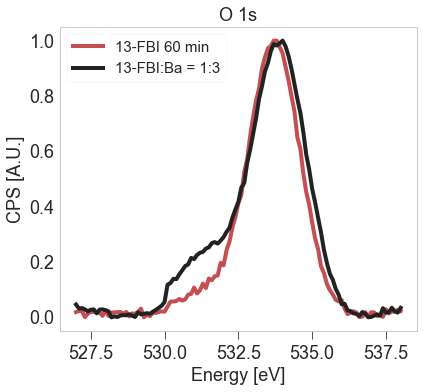

In [98]:
xp_norm = normalise_dfx(progba[0], inplace=False)
xp_norm2 = normalise_dfx(progba[-1], inplace=False)
plot_region(xp_norm, 'O_1s')
plot_region(xp_norm2, 'O_1s', col='k')
plt.gca().set(title='O 1s')

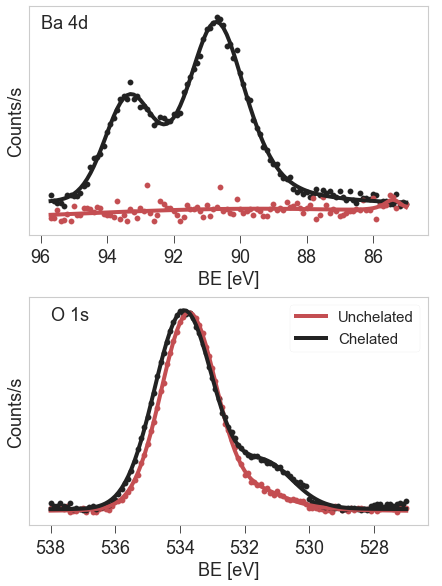

In [100]:
region = 'Ba_4d'
fig, ax = plt.subplots(2, sharex=False, figsize=(6, 8), )

for i,xp in enumerate([progba[-1], progba[0]]):
#     line = hatchplot_fit(xp, region, xp.fit['Ba_4d'], ax=ax[0]).lines
    plot_fit_result(xp, 'Ba_4d', fitRes=xp.fit['Ba_4d'], ax=ax[0], flag_fill=True, plot_comps=False)

for i, xp in enumerate([xp_norm, xp_norm2]):
    Fn = XPFit(xp, region='O_1s')
    Fn.double_voigt(sepPt=532)

    li = plot_fit_result(xp, 'O_1s', fitRes=xp.fit['O_1s'], ax=ax[1], flag_fill=True, plot_comps=False)

    if i == 0: yl1 = ax[0].get_ylim()
    ax[0].set(ylim=yl1, yticks=[])
    
    ax[i].invert_xaxis()
    ax[i].set(xlabel='BE [eV]', ylabel='Counts/s', yticks=[])
ax[0].text(s='Ba 4d', x = 96, y = 0.9*yl1[1])
ax[1].text(s='O 1s', x = 538, y = 0.9*(ax[1].get_ylim()[1]) )

ax[1].legend(li, labels=['Unchelated', 'Chelated'])


plt.tight_layout(w_pad=0.5, h_pad=0.5, pad=0.1)

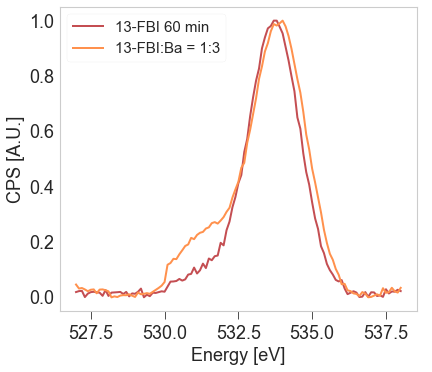

In [284]:
plot_region(xp_norm, 'O_1s')
plot_region(xp_norm2, 'O_1s')

In [55]:
(progba[3].area['Ba_4d_v1_']) / (progba[3].area['Ba_4d_v2_']), (5/2)/(3/2)

(2.9766403248405853, 1.6666666666666667)

In [54]:
for i in range(1,4):
    print((progba[i].area['Ba_4d_v1_']) / (progba[i].area['Ba_4d_v2_']), (5/2)/(3/2) )

2.2842571801389293 1.6666666666666667
3.356131374125169 1.6666666666666667
2.9766403248405853 1.6666666666666667


In [229]:
progba[0].fit['Ba_4d'].params['v1_center'].stderr

# progba[0].fit['Ba_4d'].params.pretty_print()

0.10791873825197605

In [238]:
parg1, bounds1 = [], []
for p in ['v1_height', 'v1_center', 'v1_sigma']:
    val = progba[0].fit['Ba_4d'].params[p].value
    bounds = (val + progba[0].fit['Ba_4d'].params[p].stderr,
              val - progba[0].fit['Ba_4d'].params[p].stderr)
    parg1.append(val)
    bounds1.append(bounds)

In [241]:
parg2, bounds2 = [], []
for p in ['v2_height', 'v2_center', 'v2_sigma']:
    val = progba[0].fit['Ba_4d'].params[p].value
    bounds = (val + progba[0].fit['Ba_4d'].params[p].stderr,
              val - progba[0].fit['Ba_4d'].params[p].stderr)
    parg2.append(val)
    bounds2.append(bounds)

In [248]:
progba[3].area

{'O_1s': 2305.266987898658,
 'O_1s_v1_': 0.18834909946113126,
 'O_1s_v2_': 0.8116509005388688,
 'Ba_4d': 1047.306655915687,
 'Ba_4d_v1_': 0.6177517018070807,
 'Ba_4d_v2_': 0.19983197868192706,
 'Ba_4d_g1_': 0.06722667221627396,
 'Ba_4d_g2_': 0.11518964729471835}

In [197]:
(progba[3].area['Ba_4d_v1_'] - progba[0].area['Ba_4d_v1_']) / (progba[3].area['Ba_4d_v2_']), 5/3

(1.8381810473243831, 1.6666666666666667)

In [249]:
(progba[3].area['Ba_4d_v1_']) / (progba[3].area['Ba_4d_v2_']), (5/2)/(3/2)

(3.0913555772289945, 1.6666666666666667)

#### Table results

In [146]:
for xp in xpba:
    print(xp.name)

11-Cu_FBI_subl_20min_BaCl2_2min
12-Cu_FBI_subl_20min_BaCl2_4min
13-Cu_FBI_subl_60min_BaCl2_4min


In [158]:
def table_fbifbiba(region):
    """Print a table with fit results and relative areas dict"""
    par_table = ['center', 'fwhm', 'area']
    head = 'exp & comp & '
    head2 = ''
    for par in par_table: 
        head += '%s & '%par
#         head2 += '& FBI & FBI-Ba & '
        head2 += ' v1 & v2 &'
    print(region, ' fits')
    print(head)
    print(head2)

    for xpb, xp in zip(xpba, xpfbi):
        fit = xp.fit[region]
        fitba = xpb.fit[region]
        linef = '\hline\n {} & FBI & '
        lineb = '\hline\n {} & FBI-Ba & '
        for par in par_table[:-1]:
            for i, comp in enumerate(fitba.components):
                pref = comp.prefix          
                linef += '%.2f & '%fit.values[pref + par]
                lineb += '%.2f & '%fitba.values[pref + par]
        linef += '%.2f & '%xp.area[region+'_v1_']
        linef += '%.2f \\\ \n '%xp.area[region+'_v2_']
        lineb += '%.2f & '%xpb.area[region+'_v1_']
        lineb += '%.2f \\\ \n'%xpb.area[region+'_v2_']
        print(linef)
        print(lineb)


In [159]:
table_fbifbiba(region='O_1s')

O_1s  fits
exp & comp & center & fwhm & area & 
 v1 & v2 & v1 & v2 & v1 & v2 &
\hline
 {} & FBI & 530.84 & 533.32 & 2.00 & 1.99 & 0.11 & 0.89 \\ 
 
\hline
 {} & FBI-Ba & 531.23 & 533.58 & 1.81 & 2.13 & 0.19 & 0.81 \\ 

\hline
 {} & FBI & 531.21 & 533.37 & 2.00 & 1.93 & 0.14 & 0.86 \\ 
 
\hline
 {} & FBI-Ba & 531.13 & 533.63 & 1.81 & 2.15 & 0.17 & 0.83 \\ 

\hline
 {} & FBI & 531.46 & 533.73 & 2.22 & 2.01 & 0.11 & 0.89 \\ 
 
\hline
 {} & FBI-Ba & 531.51 & 533.93 & 2.42 & 2.02 & 0.14 & 0.86 \\ 



In [162]:
table_fit_area(progba, region='O_1s')

comp	center	fwhm	amplitude	area	
v1	531.41	 2.12	 287.83	 0.09
v2	533.72	 2.02	 2555.79	 0.91
v1	531.35	 2.15	 355.49	 0.12
v2	533.92	 2.07	 2569.01	 0.88
v1	531.29	 2.08	 424.01	 0.15
v2	533.95	 2.12	 2255.15	 0.85
v1	531.36	 2.09	 443.52	 0.19
v2	533.88	 2.13	 1873.49	 0.81


In [138]:
xpba[0].area

{'O_1s': 1618.2719429697158,
 'O_1s_v1_': 0.1864660499185209,
 'O_1s_v2_': 0.8135339500814791,
 'N_1s': 416.1048521377488,
 'N_1s_v1_': 0.7572609419150454,
 'N_1s_v2_': 0.24273905808495458,
 'C_1s': 3009.1521596961966,
 'C_1s_v1_': 0.33717163537271355,
 'C_1s_v2_': 0.6628283646272864}

## Store results

In [163]:
for xp in xpfbi+xpba+progba:
    write_processed_xp(xp.path, xp)

Storing of file /Users/pabloherrero/sabat/xps_spectra/FBI_Cu/FBI_subl/2021_02_01_Cu/proc/20210201_11-Cu_FBI_subl_20min.uxy.ft successful
Storing of file /Users/pabloherrero/sabat/xps_spectra/FBI_Cu/FBI_subl/2021_02_02_Cu/proc/20210202_12-Cu_FBI_subl_20min.uxy.ft successful
Storing of file /Users/pabloherrero/sabat/xps_spectra/FBI_Cu/FBI_subl/2021_02_03_Cu/proc/20210203_13-Cu_FBI_subl_60min.uxy.ft successful
Storing of file /Users/pabloherrero/sabat/xps_spectra/FBI_Cu/FBI_subl/2021_02_05_Cu/proc/20210205_14-Cu_FBI_subl_8min.uxy.ft successful
Storing of file /Users/pabloherrero/sabat/xps_spectra/FBI_Cu/FBI_subl/2021_02_01_Cu/proc/20210201_11-Cu_FBI_subl_20min_BaCl2_2min.uxy.ft successful
Storing of file /Users/pabloherrero/sabat/xps_spectra/FBI_Cu/FBI_subl/2021_02_02_Cu/proc/20210202_12-Cu_FBI_subl_20min_BaCl2_4min.uxy.ft successful
Storing of file /Users/pabloherrero/sabat/xps_spectra/FBI_Cu/FBI_subl/2021_02_03_Cu/proc/20210203_13-Cu_FBI_subl_60min_BaCl2_08min.uxy.ft successful
Storing 

# Figures paper

In [300]:
xp_norm2.color = 'k'

In [105]:
banorm = [normalise_dfx(xp) for xp in progba]

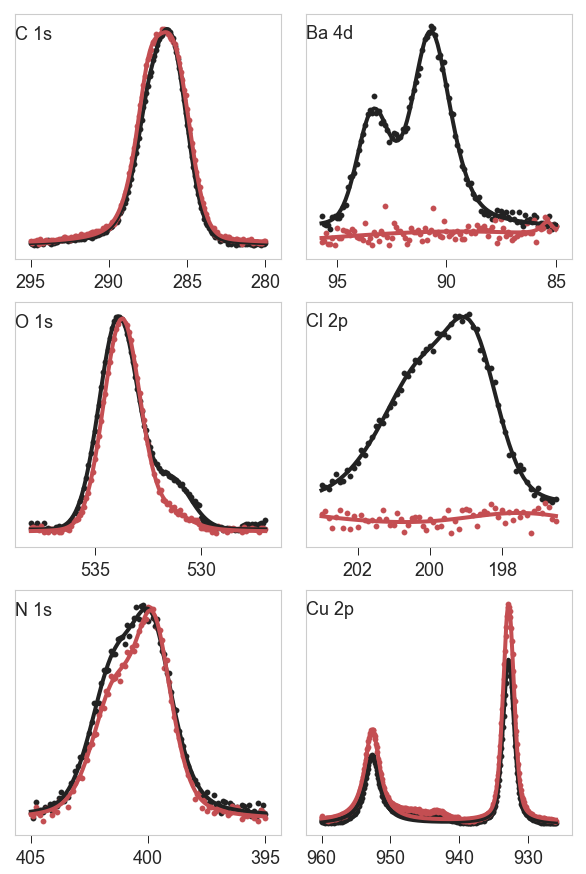

In [118]:
fig, ax = plt.subplots(3,2, sharex=False, figsize=(8, 12), )

reg2 = ['C_1s', 'O_1s', 'N_1s']
seps = [286.5, 532, 401]
for j,r in enumerate(reg2):
    for i, xp in enumerate([banorm[-1], banorm[0]]):
#         Fn = XPFit(xp, region = r)
#         Fn.double_voigt(sepPt=seps[j])
        plot_fit_result(xp, r, fitRes=xp.fit[r], ax=ax[j][0], flag_fill=True, plot_comps=False)
    ax[j][0].set(xlabel='', ylabel='', yticks=[])
    ax[j][0].invert_xaxis()
    ax[j][0].text(s=r.replace('_', ' '), x=(ax[j][0].get_xlim()[0]), y=(ax[j][0].get_ylim()[1]*0.9))
    ax[j][0].minorticks_on()
    ax[j][0].tick_params('both', length=8, width=1, which='major')



reg1 = ['Ba_4d', 'Cl_2p', 'Cu_2p']
for j,r in enumerate(reg1):
    for i,xp in enumerate([progba[-1], progba[0]]):
        plot_fit_result(xp, r, fitRes=xp.fit[r], ax=ax[j][1], flag_fill=True, plot_comps=False)
    ax[j][1].set(xlabel='', ylabel='', yticks=[])
    ax[j][1].invert_xaxis()
    ax[j][1].text(s=r.replace('_', ' '), x=(ax[j][1].get_xlim()[0]), y=(ax[j][1].get_ylim()[1]*0.9))
    
    ax[j][1].tick_params('both', length=8, width=1, which='major')
    
plt.tight_layout(w_pad=0.5, h_pad=0.2, pad=0.1)
plt.gcf().savefig('/Users/pabloherrero/Dropbox/phd/drafts/fbi_cu_sublimation/v3/fbi_ba_3to1.png', dpi=200)

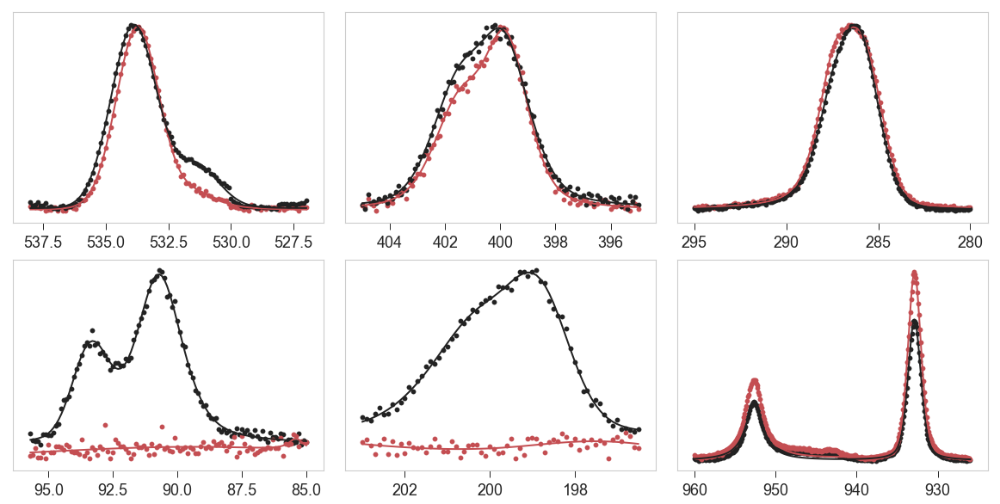

In [316]:
fig, ax = plt.subplots(2, 3, sharex=False, figsize=(16, 8), )

reg2 = ['O_1s', 'N_1s', 'C_1s',]
seps = [ 532, 401, 286.5,]
for j,r in enumerate(reg2):
    for i, xp in enumerate([banorm[-1], banorm[0]]):
        Fn = XPFit(xp, region = r)
        Fn.double_voigt(sepPt=seps[j])
        plot_fit_result(xp, r, fitRes=xp.fit[r], ax=ax[0][j], flag_fill=True, plot_comps=False)
    ax[0][j].set(xlabel='', ylabel='', yticks=[])
#     ax[0][j].text(s=r.replace('_', ' '), x=(ax[0][j].get_xlim()[1]), y=(ax[0][j].get_ylim()[1]*0.9))
    
    ax[0][j].invert_xaxis()
    ax[0][j].minorticks_on()
    ax[0][j].tick_params('both', length=8, width=1, which='major')

reg1 = ['Ba_4d', 'Cl_2p', 'Cu_2p']
for j,r in enumerate(reg1):
    for i,xp in enumerate([progba[-1], progba[0]]):
        li = plot_fit_result(xp, r, fitRes=xp.fit[r], ax=ax[1][j], flag_fill=True, plot_comps=False)
    ax[1][j].set( xlabel='', ylabel='', yticks=[])
#     ax[1][j].text(s=r.replace('_', ' '), x=(ax[1][j].get_xlim()[1]), y=(ax[1][j].get_ylim()[1]*0.9))
    
    ax[1][j].invert_xaxis()
    ax[1][j].tick_params('both', length=8, width=1, which='major')
    
plt.tight_layout(w_pad=0.5, h_pad=0.2, pad=0.1)
# ax[0][0].legend(list(li.get_lines()), labels = [progba[-1].name, progba[0].name], ncol=2,
#             loc="upper right", bbox_to_anchor=(1.0, 1.2), fontsize=16)           


## FBI coverage

In [119]:
path = '/Users/pabloherrero/sabat/xps_spectra/FBI_Cu/FBI_subl/2021_0*/**/*.sxy'

files = glob.glob(path, recursive=True)
files.sort()
files_new = []

for f in files:
    files_new.append(f)
        
files = files_new

In [120]:
fbi_exps = []
ba_exps = []
for f in files:
    if ('FBI_subl_' in f) and ('BaCl2' not in f):
        fbi_exps.append(read_processed_xp(f))
    elif 'BaCl2' in f:
        ba_exps.append(read_processed_xp(f))

clean_exps = []
for f in files:
    if 'clean' in f:
        clean_exps.append(read_processed_xp(f))

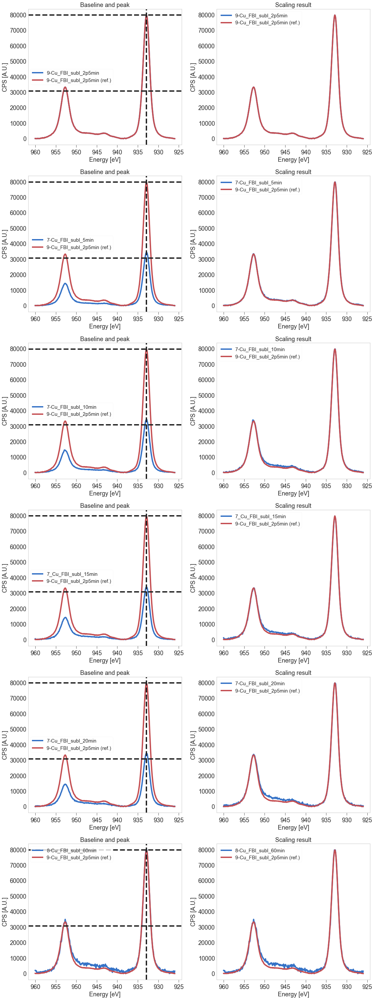

In [65]:
sele2 = [xp for xp in fbi_exps if ('7-' in xp.path) ]
selection = [fbi_exps[7]] + sele2
selection.append(fbi_exps[6])
selection = scale_and_plot_spectra(selection, indRef=0, region='Cu_2p')

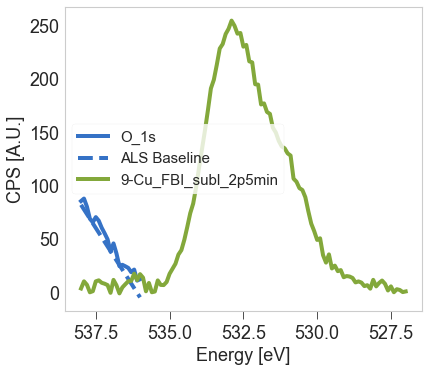

In [66]:
fix_tail_bg(selection[0], 'O_1s', edw=536, inplace=True);

In [67]:
for xp in selection:
    xp.name = xp.name[14:].replace('min', ' min')
selection[0].name = selection[0].name.replace('p', '.')
plt.rcParams['lines.linewidth'] = 4

array([[<matplotlib.axes._subplots.AxesSubplot object at 0x1a26cf2588>,
      dtype=object)

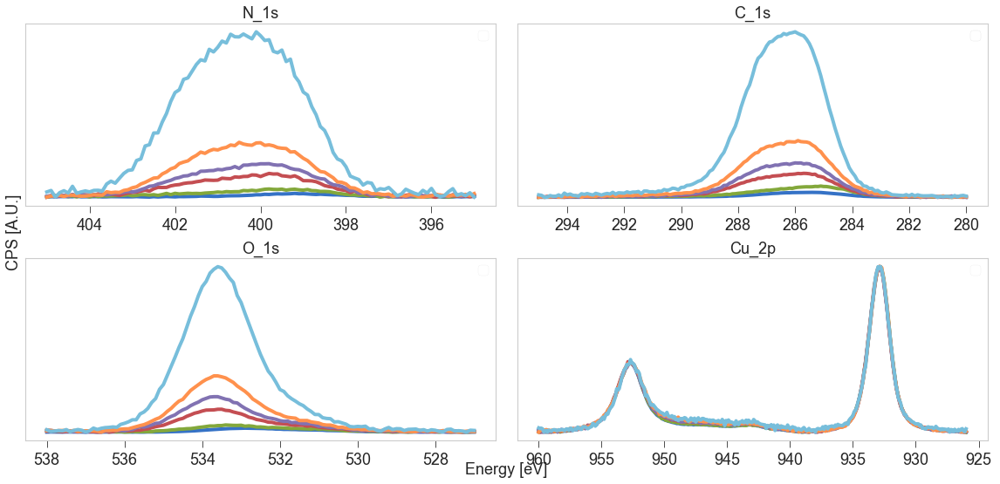

In [60]:
regions= ['N_1s', 'C_1s', 'O_1s', 'Cu_2p']

plot_xp_regions(selection, regions, ncols=2)
# plt.gcf().savefig('/Users/pabloherrero/Dropbox/phd/papers/fbi_cu_sublim_v2/FBI_growth_many.png', dpi=200)

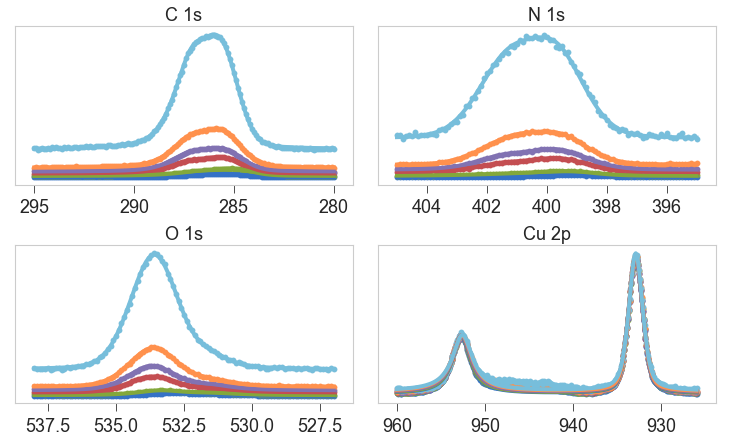

In [61]:
regions= ['C_1s', 'O_1s', 'N_1s', 'Cu_2p']
fig, ax = plt.subplots(2,2, sharex=False, figsize=(10, 6), )

seps = [286.5, 532, 401, 950]
for j,r in enumerate(regions):
    for i, xp in enumerate(selection):
        k, l = j%2, j//2
        Fn = XPFit(xp, region = r)
        Fn.double_voigt(sepPt=seps[j])
        plot_fit_result(xp, r, fitRes=xp.fit[r], ax=ax[k][l], flag_fill=True, offset=1+i/100, plot_comps=False)
    ax[k][l].set(title=r.replace('_', ' '), xlabel='', ylabel='', yticks=[])
    ax[k][l].invert_xaxis()
plt.tight_layout(w_pad=0.5, h_pad=0.5, pad=0.1)
# plt.gcf().savefig('/Users/pabloherrero/Dropbox/phd/papers/fbi_cu_sublimation/v3/fbi_coverage_all.png', dpi=200)

### Normalized

In [68]:
norm_sel = [normalise_dfx(xp) for xp in selection]

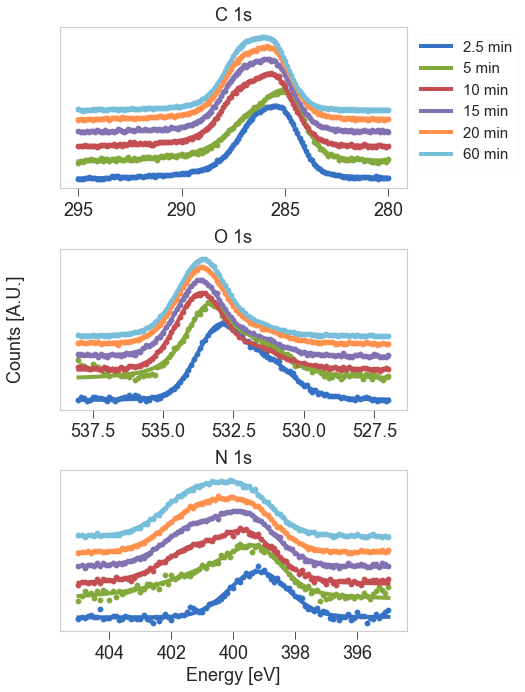

In [79]:
# selection = [xp for xp in fbi_exps if ('7-' in xp.path)]
regions= ['C_1s', 'O_1s', 'N_1s']
coverages = [0.47, 0.65, 1.09, 1.41, 1.82, 3.02]
fig, ax = plt.subplots(3, sharex=False, figsize=(6, 10), )
axx = fig.add_subplot(111, frameon=False)
# hide tick and tick label of the big axes
axx.tick_params(labelcolor='none', top=False, bottom=False, left=False, right=False)
plt.xlabel("Energy [eV]")
plt.ylabel("Counts [A.U.]")

seps = [286.5, 532, 401]
for j,r in enumerate(regions):
    for i, xp in enumerate(norm_sel):
#         k, l = j%2, j//2
#         Fn = XPFit(xp, region = r)
#         Fn.double_voigt(sepPt=seps[j])
        li = plot_fit_result(xp, r, fitRes=xp.fit[r], ax=ax[j], flag_fill=True, offset=1+8*i/10, plot_comps=False)
    ax[j].set(title=r.replace('_', ' '), xlabel='', ylabel='', yticks=[])
    ax[j].invert_xaxis()

plt.tight_layout(w_pad=0.5, h_pad=0.5, pad=0.1)     #  First manage the space and THEN add the legend
ax[0].legend(list(li.get_lines()), labels = [xp.name for xp in selection], ncol=1,
            loc="upper left", bbox_to_anchor=(1., 1.))           

# fig.savefig('/Users/pabloherrero/Dropbox/phd/drafts/fbi_cu_sublimation/v3/fbi_coverage_all_norm.png', dpi=200, bbox_inches = 'tight')

In [ ]:
tsubl4 = [5, 10, 15, 20, 5, 15, 60, 2.5]
matrix([[6.51323846e-01, 1.16140270e-03],
        [1.08637052e+00, 3.27288126e-03],
        [1.41274162e+00, 3.49811320e-03],
        [1.82644117e+00, 3.82795998e-03],
        [7.24651170e-01, 1.30998972e-03],
        [1.54539729e+00, 3.59823743e-03],
        [3.02141495e+00, 5.11686513e-03],
        [4.75515898e-01, 8.51986016e-04]])
coverages = [0.47, 0.65, 1.09, 1.41, 1.82, 3.02]

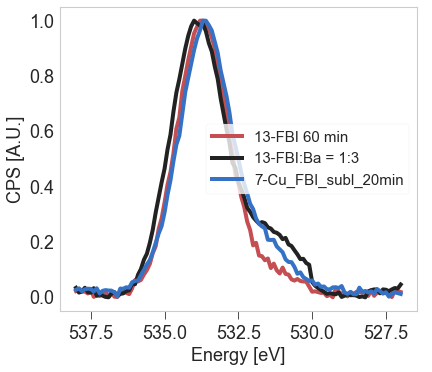

In [128]:
color = ['r', 'k', 'b']
for i,xp in enumerate([progba[0], progba[-1], selection[3]]):
    xpn = normalise_dfx(xp)
    plot_region(xpn, 'O_1s', col=color[i])

## Progressive barium

In [123]:
for xp in progba:
    xp.name = xp.name[3:]

progba[0].name = 'FBI:Ba = 1:0'

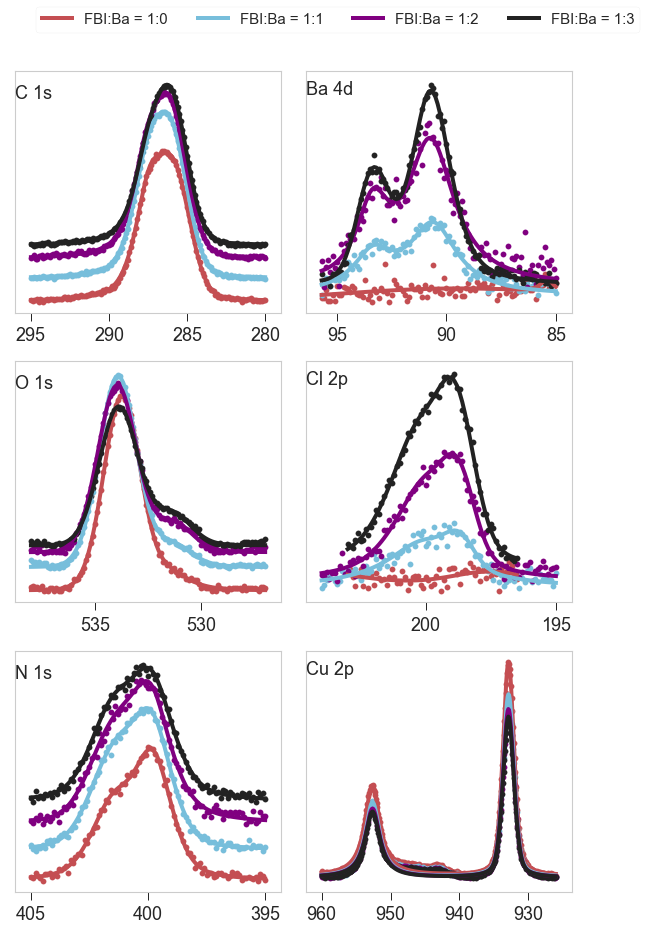

In [127]:
fig, ax = plt.subplots(3, 2, sharex=False, figsize=(8, 12), )

reg2 = ['C_1s', 'O_1s', 'N_1s']
seps = [286.5, 532, 401]
for j,r in enumerate(reg2):
    for i, xp in enumerate(progba):
#         xp = normalise_dfx(xpo)
        Fn = XPFit(xp, region = r)
        Fn.double_voigt(sepPt=seps[j])
        plot_fit_result(xp, r, fitRes=xp.fit[r], ax=ax[j][0], offset=1+5*i/10,
                        flag_fill=True, plot_comps=False)
    ax[j][0].set(xlabel='', ylabel='', yticks=[])
    ax[j][0].invert_xaxis()
    ax[j][0].text(s=r.replace('_', ' '), x=(ax[j][0].get_xlim()[0]), y=(ax[j][0].get_ylim()[1]*0.9))
    ax[j][0].minorticks_on()
    ax[j][0].tick_params('both', length=8, width=1, which='major')



reg1 = ['Ba_4d', 'Cl_2p', 'Cu_2p']
for j,r in enumerate(reg1):
    for i,xp in enumerate(progba):
        li = plot_fit_result(xp, r, fitRes=xp.fit[r], ax=ax[j][1], flag_fill=True, plot_comps=False)
    ax[j][1].set( xlabel='', ylabel='', yticks=[])
    ax[j][1].invert_xaxis()
    ax[j][1].tick_params('both', length=8, width=1, which='major')
    ax[j][1].text(s=r.replace('_', ' '), x=(ax[j][1].get_xlim()[0]), y=(ax[j][1].get_ylim()[1]*0.9))
    
# ax[0][0].set(ylabel='Counts [A.U.]')
# ax[1][0].set(ylabel='Counts [A.U.]')
# ax[1][1].set(xlabel='Energy [eV]')

plt.tight_layout(w_pad=0.5, h_pad=0.5, pad=0.1)
ax[0][0].legend(list(li.get_lines()), labels = [xp.name for xp in progba], ncol=len(selection),
            loc="upper left", bbox_to_anchor=(0.05, 1.3))           

fig.savefig('/Users/pabloherrero/Dropbox/phd/drafts/fbi_cu_sublimation/v3/fbi_prog_ba.png', dpi=200, bbox_inches = 'tight')

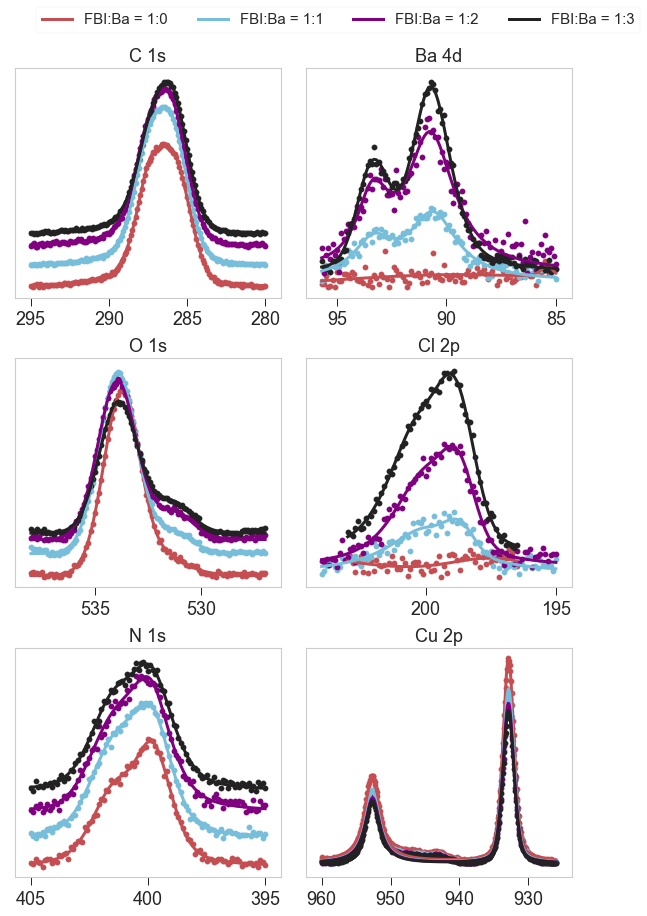

In [67]:
fig, ax = plt.subplots(3, 2, sharex=False, figsize=(8, 12), )

reg2 = ['C_1s', 'O_1s', 'N_1s']
seps = [286.5, 532, 401]
for j,r in enumerate(reg2):
    for i, xp in enumerate(progba):
#         xp = normalise_dfx(xpo)
        Fn = XPFit(xp, region = r)
        Fn.double_voigt(sepPt=seps[j])
        plot_fit_result(xp, r, fitRes=xp.fit[r], ax=ax[j][0], offset=1+5*i/10,
                        flag_fill=True, plot_comps=False)
    ax[j][0].set(title=r.replace('_', ' '), xlabel='', ylabel='', yticks=[])
    ax[j][0].invert_xaxis()
    ax[j][0].minorticks_on()
    ax[j][0].tick_params('both', length=8, width=1, which='major')



reg1 = ['Ba_4d', 'Cl_2p', 'Cu_2p']
for j,r in enumerate(reg1):
    for i,xp in enumerate(progba):
        li = plot_fit_result(xp, r, fitRes=xp.fit[r], ax=ax[j][1], flag_fill=True, plot_comps=False)
    ax[j][1].set(title=r.replace('_', ' '), xlabel='', ylabel='', yticks=[])
    ax[j][1].invert_xaxis()
    ax[j][1].tick_params('both', length=8, width=1, which='major')
    
# ax[0][0].set(ylabel='Counts [A.U.]')
# ax[1][0].set(ylabel='Counts [A.U.]')
# ax[1][1].set(xlabel='Energy [eV]')

plt.tight_layout(w_pad=0.5, h_pad=0.5, pad=0.1)
ax[0][0].legend(list(li.get_lines()), labels = [xp.name for xp in progba], ncol=len(selection),
            loc="upper left", bbox_to_anchor=(0.05, 1.3))           

# fig.savefig('/Users/pabloherrero/Dropbox/phd/papers/fbi_cu_sublimation/v3/fbi_prog_ba.png', dpi=200, bbox_inches = 'tight')

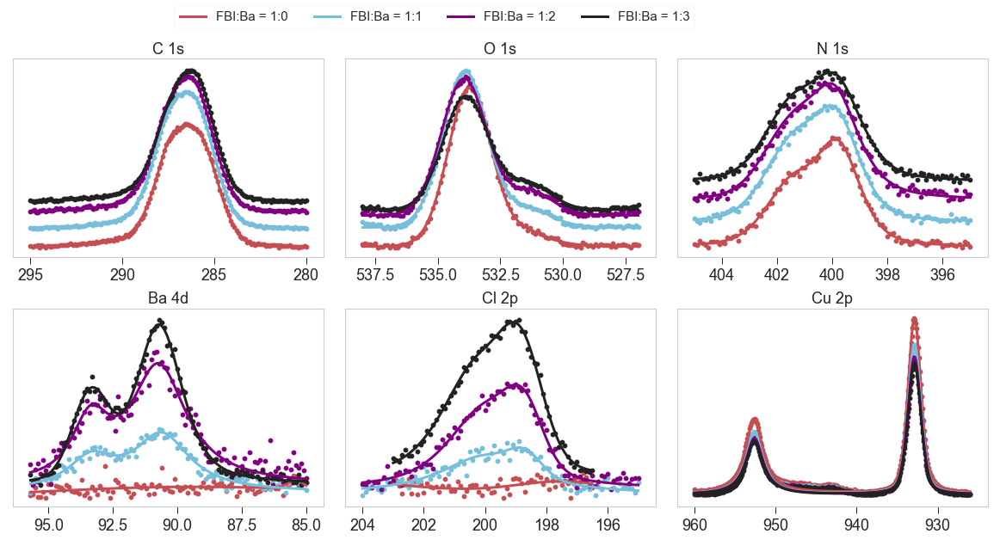

In [163]:
fig, ax = plt.subplots(2, 3, sharex=False, figsize=(16, 8), )

reg2 = ['C_1s', 'O_1s', 'N_1s']
seps = [286.5, 532, 401]
for j,r in enumerate(reg2):
    for i, xp in enumerate(progba):
#         xp = normalise_dfx(xpo)
        Fn = XPFit(xp, region = r)
        Fn.double_voigt(sepPt=seps[j])
        plot_fit_result(xp, r, fitRes=xp.fit[r], ax=ax[0][j], offset=1+5*i/10,
                        flag_fill=True, plot_comps=False)
    ax[0][j].set(title=r.replace('_', ' '), xlabel='', ylabel='', yticks=[])
    ax[0][j].invert_xaxis()
    ax[0][j].minorticks_on()
    ax[0][j].tick_params('both', length=8, width=1, which='major')

reg1 = ['Ba_4d', 'Cl_2p', 'Cu_2p']
for j,r in enumerate(reg1):
    for i,xp in enumerate(progba):
        li = plot_fit_result(xp, r, fitRes=xp.fit[r], ax=ax[1][j], flag_fill=True, plot_comps=False)
    ax[1][j].set(title=r.replace('_', ' '), xlabel='', ylabel='', yticks=[])
    ax[1][j].invert_xaxis()
    ax[1][j].tick_params('both', length=8, width=1, which='major')

plt.tight_layout(w_pad=0.5, h_pad=0.5, pad=0.1)
ax[0][0].legend(list(li.get_lines()), labels = [xp.name for xp in progba], ncol=len(selection),
            loc="upper left", bbox_to_anchor=(0.5, 1.3))  

## Sub-ML fits

### N 1s

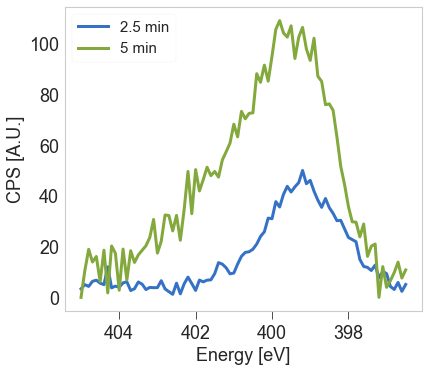

In [136]:
for xp in selection[:2]:
    xp = crop_spectrum(xp, region, edw=396.5, inplace=True)
    plot_region(xp, region)
cosmetics_plot()

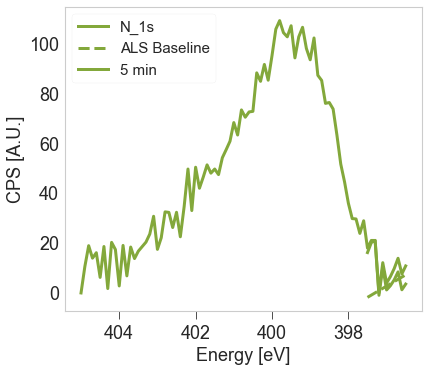

In [156]:
fix_tail_bg(selection[1], region, eup=397.5, inplace=True);

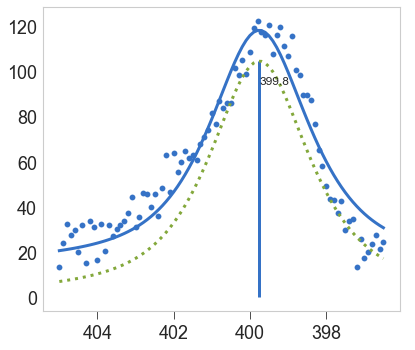

In [129]:
region = 'N_1s'
Fn = XPFit(selection[1], region=region)
# Fn.preset_pars(key='v1_fraction', val=0.9)

Fn.voigt()#(sepPt=398)
plot_fit_result(selection[1], region, fitRes=selection[1].fit[region])
plt.gca().invert_xaxis()

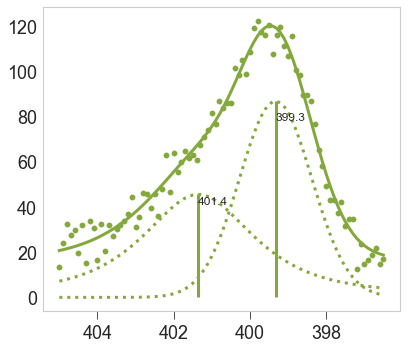

In [157]:
region = 'N_1s'
Fn = XPFit(selection[1], region=region)
# Fn.preset_pars(key='v1_fraction', val=0.9)

Fn.double_voigt(sepPt=401)
plot_fit_result(selection[1], region, fitRes=selection[1].fit[region])
Fn.set_areas()
plt.gca().invert_xaxis()

In [139]:
selection[1].area['N_1s_v1_'], selection[1].area['N_1s_v2_']

(0.4784884786777459, 0.5215115213222541)

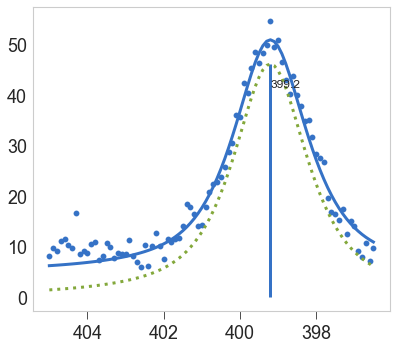

In [134]:
region = 'N_1s'
Fn = XPFit(selection[0], region=region)
# Fn.preset_pars(key='v1_fraction', val=0.9)

Fn.voigt()#(sepPt=398)
plot_fit_result(selection[0], region, fitRes=selection[0].fit[region])
plt.gca().invert_xaxis()

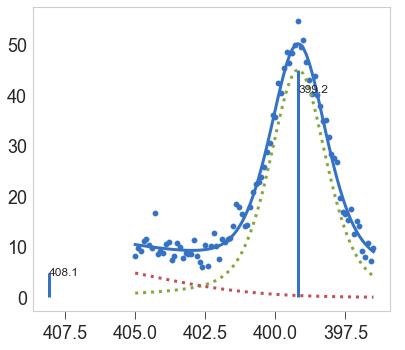

In [137]:
region = 'N_1s'
Fn = XPFit(selection[0], region=region)
# Fn.preset_pars(key='v1_fraction', val=0.9)

Fn.double_voigt(sepPt=400)
plot_fit_result(selection[0], region, fitRes=selection[0].fit[region])
plt.gca().invert_xaxis()

In [141]:
selection[0].color = 'b'
selection[1].color = 'g'

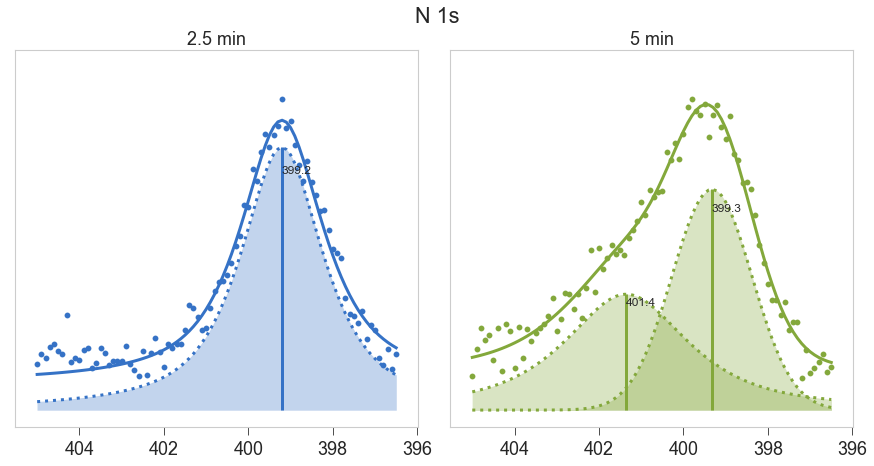

In [158]:
fig, ax = plt.subplots(1, 2, sharex=True, figsize=(12, 6 ), )

region = 'N_1s'

for i,xp in enumerate(selection[:2]):
    Fn = XPFit(xp, region=region)
    if i == 0:
        Fn.voigt()
    else:
        Fn.double_voigt(sepPt=401)
    plot_fit_result(xp, region, fitRes=xp.fit[region], ax=ax[i], flag_fill=True)
    ax[i].set( yticks=[], ylim=tuple([yl * 1.1 for yl in ax[i].get_ylim()]), title=xp.name)
    Fn.set_areas()
ax[i].invert_xaxis()
plt.tight_layout(w_pad=0.5, h_pad=0.5, pad=0.1)
fig.suptitle('N 1s', y=1.05)
ax[i].set(xlabel='', ylabel='')
plt.subplots_adjust(hspace=.0)
plt.subplots_adjust(wspace=.08)
# plt.gcf().savefig('/Users/pabloherrero/Dropbox/phd/papers/fbi_cu_sublim_v2/fits_n1s.png', dpi=200)

### Sample 14: 8 min FBI + 1 min BaCl2

In [68]:
xpba[-1].color = 'c'
lowcov = [xpfbi[-1], xpba[-1]]


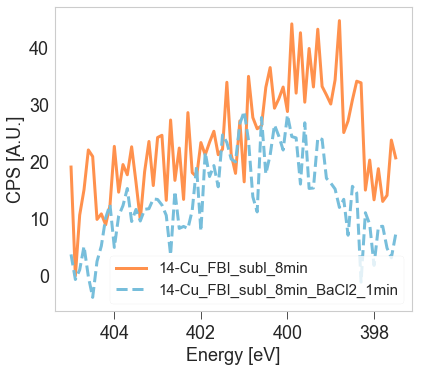

In [243]:
region = 'N_1s'
for xp in lowcov:
    xp = crop_spectrum(xp, region, edw=397.5, inplace=True)
    plot_region(xp, region)
cosmetics_plot()

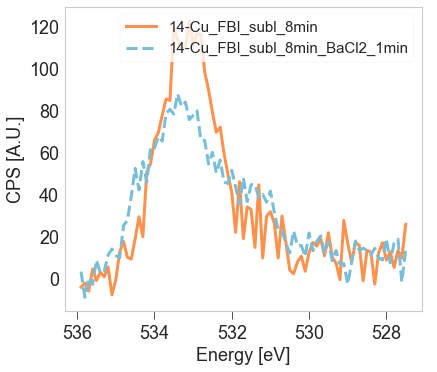

In [247]:
region = 'O_1s'
for xp in lowcov:
    xp = crop_spectrum(xp, region, eup=535.9
                       , edw=527.5, inplace=True)
    plot_region(xp, region)
cosmetics_plot()

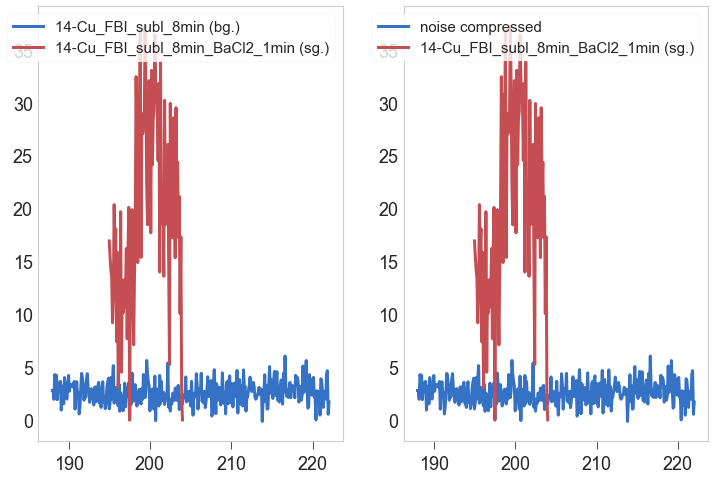

In [251]:
compress_noisy_region(lowcov[0], xpRef=lowcov[1], region='Cl_2p', inplace=True);

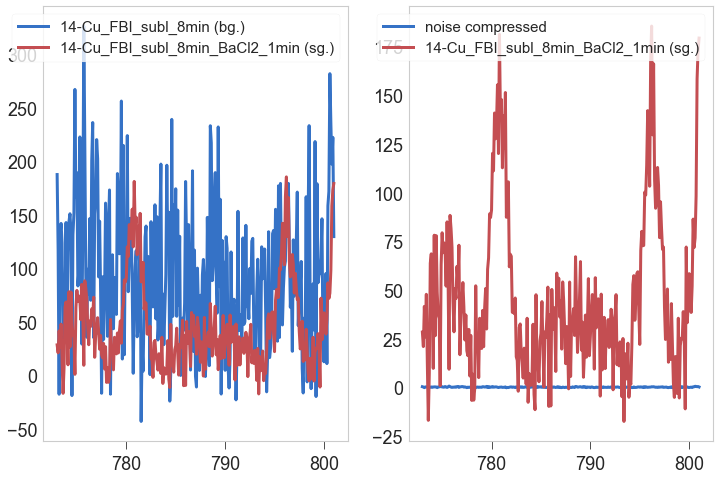

In [252]:
compress_noisy_region(lowcov[0], xpRef=lowcov[1], region='Ba_3d', inplace=True);

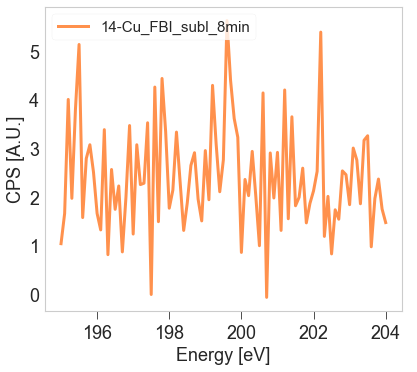

In [255]:
region = 'Cl_2p'
trim_spectra(lowcov[0], xpRef=lowcov[1], region=region, inplace=True)
plot_region(lowcov[0], region)
cosmetics_plot()

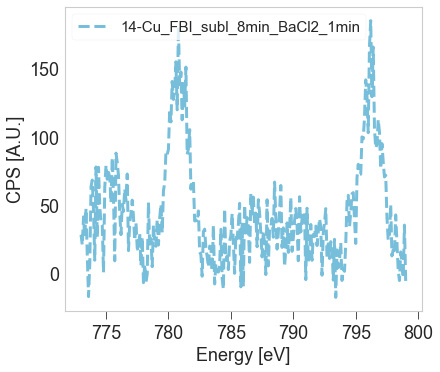

In [258]:
region = 'Ba_3d'
xp = crop_spectrum(lowcov[1], region=region,
              eup=799, inplace=True)
plot_region(xp, region)
cosmetics_plot()

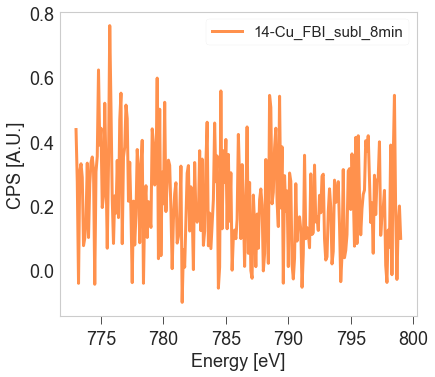

In [259]:
region = 'Ba_3d'
trim_spectra(lowcov[0], xpRef=lowcov[1], region=region, inplace=True)
plot_region(lowcov[0], region)
cosmetics_plot()

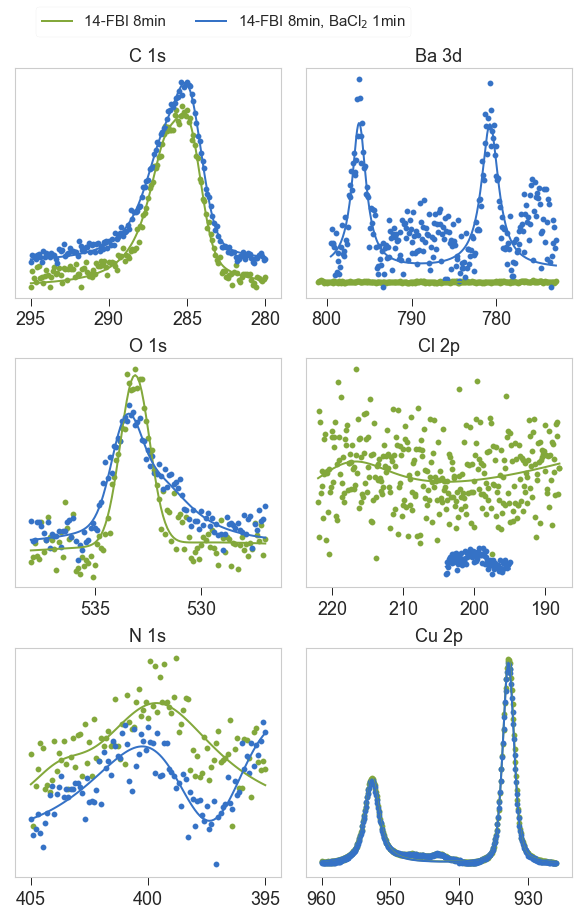

In [286]:
fig, ax = plt.subplots(3, 2, sharex=False, figsize=(8, 12), )
lowcov = [xpfbi[-1], xpba[-1]]
reg2 = ['C_1s', 'O_1s', 'N_1s']
seps = [286.5, 532, 401]
for j,r in enumerate(reg2):
    for i, xp in enumerate(lowcov):
#         xp = normalise_dfx(xpo)
        Fn = XPFit(xp, region = r)
        Fn.double_voigt(sepPt=seps[j])
        plot_fit_result(xp, r, fitRes=xp.fit[r], ax=ax[j][0], offset=1+5*i/10,
                        flag_fill=True, plot_comps=False)
    ax[j][0].set(title=r.replace('_', ' '), xlabel='', ylabel='', yticks=[])
    ax[j][0].invert_xaxis()
    ax[j][0].minorticks_on()
    ax[j][0].tick_params('both', length=8, width=1, which='major')

reg1 = ['Ba_3d', 'Cl_2p', 'Cu_2p']
seps = [790, 199, 950]
for j,r in enumerate(reg1):
    for i,xp in enumerate(lowcov):
        Fn = XPFit(xp, region = r)
        Fn.double_voigt(sepPt=seps[j])
        li = plot_fit_result(xp, r, fitRes=xp.fit[r], ax=ax[j][1], flag_fill=True, plot_comps=False)
    ax[j][1].set(title=r.replace('_', ' '), xlabel='', ylabel='', yticks=[])
    ax[j][1].invert_xaxis()
    ax[j][1].tick_params('both', length=8, width=1, which='major')

plt.tight_layout(w_pad=0.5, h_pad=0.5, pad=0.1)
ax[0][0].legend(list(li.get_lines()), labels = [xp.name for xp in lowcov], ncol=len(lowcov),
            loc="upper left", bbox_to_anchor=(0.05, 1.3))           

# fig.savefig('/Users/pabloherrero/Dropbox/phd/papers/fbi_cu_sublimation/v3/fbi_prog_ba.png', dpi=200, bbox_inches = 'tight')

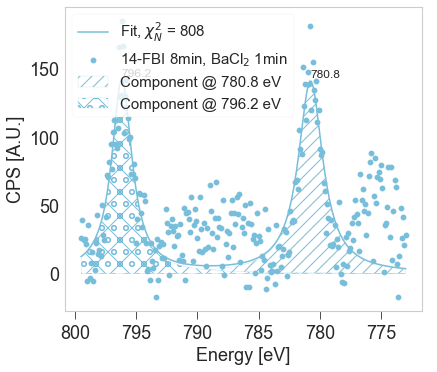

In [69]:
region = 'Ba_3d'
pars1 = []

Fn = XPFit(lowcov[1], region)
fitv = Fn.double_voigt(sepPt=790)
Fn.plot()

# Dev: store fits 

In [113]:
import lmfit
from lmfit.model import save_modelresult, load_modelresult
from lmfit.model import ModelResult, Model, Parameters

In [97]:
save_modelresult(progba[0].fit['C_1s'], '/Users/pabloherrero/sabat/xps_spectra/FBI_Cu/FBI_subl/2021_02_02_Cu/proc/test.sxy')

In [135]:
file = '/Users/pabloherrero/sabat/xps_spectra/FBI_Cu/FBI_subl/2021_02_02_Cu/proc/test.sxy'
xp = progba[0]

def store_fits(xp: XPS_experiment):
    """Store fits of a XPS_experiment in separate file"""
    file = xp.path + '.ft'
    with open(file, 'w') as fout:
        for k in xp.fit.keys():
            fout.write('XPFit %s:\n\n' %k)
            dump_region = xp.fit[k].dumps()
            fout.write(dump_region + '\n\n')
    print('Storing of file %s successful' %file)

In [134]:
store_fits(progba[0])

In [145]:
def load_fits(path: str):
    """Read stored fits in .ft files"""
    
    file = path + '.ft'
    fits = {}
    try:
        with open(file) as infile:
            lines = infile.readlines()
            for i, line in enumerate(lines):
                if 'XPFit ' in line:
                    region = line.replace('XPFit ', '').replace(':\n', '')
                    rs = ModelResult(Model(lambda x: x, None), Parameters())
                    fits[region] = rs.loads(lines[i+2])
    except FileNotFoundError as e:
        print('%s, returning empty fit dict' %e)
    return fits

In [139]:
fits = load_fits(progba[0].path)

In [146]:
fits = load_fits(progba[1].path)

[Errno 2] No such file or directory: '/Users/pabloherrero/sabat/xps_spectra/FBI_Cu/FBI_subl/2021_02_03_Cu/proc/20210203_13-Cu_FBI_subl_60min_BaCl2_04min.uxy.ft', return empty fit dict


In [149]:
readxp = read_processed_xp(progba[0].path)

In [151]:
readxp.fit['C_1s']

In [161]:
xp.fit != {}

True

In [162]:
def write_processed_xp(filepath : str, xp : XPS_experiment):
    """Save processed XPS experiment to file"""
    import csv;
    with open(filepath, 'w') as fout:
        writer = csv.writer(fout, delimiter='=')
        for att in xp.__dict__.keys():   # Loop over class attributes except dfx (last)
            if (att != 'dfx') and (att != 'ls'):
                writer.writerow([att, getattr(xp, att)])
        writer.writerow(['dfx', ''])
        xp.dfx.to_csv(fout, sep=',')
    
    if xp.fit != {}: store_fits(xp)

In [158]:
path = '/Users/pabloherrero/sabat/xps_spectra/FBI_Cu/FBI_subl/2021_02_*/**/*.uxy'

files = glob.glob(path, recursive=True)
files.sort()
files_new = []
for f in files:
    if '/proc' in f:
        files_new.append(f)
files

['/Users/pabloherrero/sabat/xps_spectra/FBI_Cu/FBI_subl/2021_02_01_Cu/proc/20210201_11-Cu_FBI_subl_20min.uxy',
 '/Users/pabloherrero/sabat/xps_spectra/FBI_Cu/FBI_subl/2021_02_01_Cu/proc/20210201_11-Cu_FBI_subl_20min_BaCl2_2min.uxy',
 '/Users/pabloherrero/sabat/xps_spectra/FBI_Cu/FBI_subl/2021_02_01_Cu/proc/20210201_11-Cu_clean.uxy',
 '/Users/pabloherrero/sabat/xps_spectra/FBI_Cu/FBI_subl/2021_02_02_Cu/proc/20210202_12-Cu_FBI_subl_20min.uxy',
 '/Users/pabloherrero/sabat/xps_spectra/FBI_Cu/FBI_subl/2021_02_02_Cu/proc/20210202_12-Cu_FBI_subl_20min_BaCl2_4min.uxy',
 '/Users/pabloherrero/sabat/xps_spectra/FBI_Cu/FBI_subl/2021_02_02_Cu/proc/20210202_12-Cu_clean.uxy',
 '/Users/pabloherrero/sabat/xps_spectra/FBI_Cu/FBI_subl/2021_02_03_Cu/proc/20210203_13-Cu_FBI_subl_60min.uxy',
 '/Users/pabloherrero/sabat/xps_spectra/FBI_Cu/FBI_subl/2021_02_03_Cu/proc/20210203_13-Cu_FBI_subl_60min_BaCl2_04min.uxy',
 '/Users/pabloherrero/sabat/xps_spectra/FBI_Cu/FBI_subl/2021_02_03_Cu/proc/20210203_13-Cu_FBI_su